In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F


def weights_init(w):
    """
    Initializes the weights of the layer, w.
    """
    classname = w.__class__.__name__
    if classname.find('conv') != -1:
        nn.init.normal_(w.weight.data, 0.0, 0.02)
    elif classname.find('bn') != -1:
        nn.init.normal_(w.weight.data, 1.0, 0.02)
        nn.init.constant_(w.bias.data, 0)

# Define the Generator Network
class Generator(nn.Module):
    def __init__(self, params):
        super().__init__()

        # Input is the latent vector Z.
        self.tconv1 = nn.ConvTranspose2d(params['nz'], params['ngf']*8,
            kernel_size=4, stride=1, padding=0, bias=False)
        self.bn1 = nn.BatchNorm2d(params['ngf']*8)

        # Input Dimension: (ngf*8) x 4 x 4
        self.tconv2 = nn.ConvTranspose2d(params['ngf']*8, params['ngf']*4,
            4, 2, 1, bias=False)
        self.bn2 = nn.BatchNorm2d(params['ngf']*4)

        # Input Dimension: (ngf*4) x 8 x 8
        self.tconv3 = nn.ConvTranspose2d(params['ngf']*4, params['ngf']*2,
            4, 2, 1, bias=False)
        self.bn3 = nn.BatchNorm2d(params['ngf']*2)

        # Input Dimension: (ngf*2) x 16 x 16
        self.tconv4 = nn.ConvTranspose2d(params['ngf']*2, params['ngf'],
            4, 2, 1, bias=False)
        self.bn4 = nn.BatchNorm2d(params['ngf'])

        # Input Dimension: (ngf) * 32 * 32
        self.tconv5 = nn.ConvTranspose2d(params['ngf'], params['nc'],
            4, 2, 1, bias=False)
        #Output Dimension: (nc) x 64 x 64

    def forward(self, x):
        x = F.relu(self.bn1(self.tconv1(x)))
        x = F.relu(self.bn2(self.tconv2(x)))
        x = F.relu(self.bn3(self.tconv3(x)))
        x = F.relu(self.bn4(self.tconv4(x)))

        x = F.tanh(self.tconv5(x))

        return x

# Define the Discriminator Network
class Discriminator(nn.Module):
    def __init__(self, params):
        super().__init__()

        # Input Dimension: (nc) x 64 x 64
        self.conv1 = nn.Conv2d(params['nc'], params['ndf'],
            4, 2, 1, bias=False)

        # Input Dimension: (ndf) x 32 x 32
        self.conv2 = nn.Conv2d(params['ndf'], params['ndf']*2,
            4, 2, 1, bias=False)
        self.bn2 = nn.BatchNorm2d(params['ndf']*2)

        # Input Dimension: (ndf*2) x 16 x 16
        self.conv3 = nn.Conv2d(params['ndf']*2, params['ndf']*4,
            4, 2, 1, bias=False)
        self.bn3 = nn.BatchNorm2d(params['ndf']*4)

        # Input Dimension: (ndf*4) x 8 x 8
        self.conv4 = nn.Conv2d(params['ndf']*4, params['ndf']*8,
            4, 2, 1, bias=False)
        self.bn4 = nn.BatchNorm2d(params['ndf']*8)

        # Input Dimension: (ndf*8) x 4 x 4
        self.conv5 = nn.Conv2d(params['ndf']*8, 1, 4, 1, 0, bias=False)

    def forward(self, x):
        x = F.leaky_relu(self.conv1(x), 0.2, True)
        x = F.leaky_relu(self.bn2(self.conv2(x)), 0.2, True)
        x = F.leaky_relu(self.bn3(self.conv3(x)), 0.2, True)
        x = F.leaky_relu(self.bn4(self.conv4(x)), 0.2, True)

        x = F.sigmoid(self.conv5(x))

        return x

In [2]:
import torch
import torchvision.transforms as transforms
import torchvision.datasets as dset

# Directory containing the data.
root = '/kaggle/input/celeba-dataset'

def get_celeba(params):
    """
    Loads the dataset and applies proproccesing steps to it.
    Returns a PyTorch DataLoader.

    """
    # Data proprecessing.
    transform = transforms.Compose([
        transforms.Resize(params['imsize']),
        transforms.CenterCrop(params['imsize']),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5),
            (0.5, 0.5, 0.5))])

    # Create the dataset.
    dataset = dset.ImageFolder(root=root, transform=transform)

    # Create the dataloader.
    dataloader = torch.utils.data.DataLoader(dataset,
        batch_size=params['bsize'],
        shuffle=True)

    return dataloader

Random Seed:  369
cuda:0  will be used.



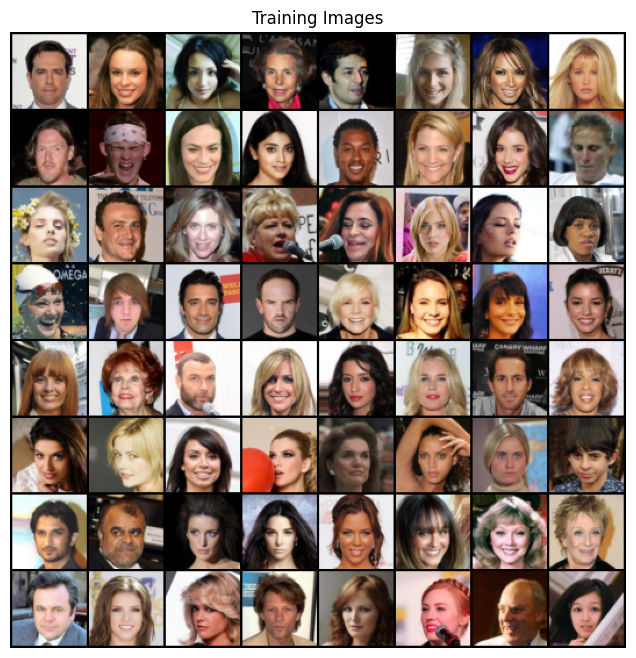

In [3]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import random

# from utils import get_celeba
# from dcgan import weights_init, Generator, Discriminator

# Set random seed for reproducibility.
seed = 369
random.seed(seed)
torch.manual_seed(seed)
print("Random Seed: ", seed)

# Parameters to define the model.
params = {
    "bsize" : 128,# Batch size during training.
    'imsize' : 64,# Spatial size of training images. All images will be resized to this size during preprocessing.
    'nc' : 3,# Number of channles in the training images. For coloured images this is 3.
    'nz' : 100,# Size of the Z latent vector (the input to the generator).
    'ngf' : 64,# Size of feature maps in the generator. The depth will be multiples of this.
    'ndf' : 64, # Size of features maps in the discriminator. The depth will be multiples of this.
    'nepochs' : 10,# Number of training epochs.
    'lr' : 0.0002,# Learning rate for optimizers
    'beta1' : 0.5,# Beta1 hyperparam for Adam optimizer
    'save_epoch' : 2}# Save step.

# Use GPU is available else use CPU.
device = torch.device("cuda:0" if(torch.cuda.is_available()) else "cpu")
print(device, " will be used.\n")

# Get the data.
dataloader = get_celeba(params)

# Plot the training images.
sample_batch = next(iter(dataloader))
plt.figure(figsize=(8, 8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(
    sample_batch[0].to(device)[ : 64], padding=2, normalize=True).cpu(), (1, 2, 0)))

plt.show()


In [4]:
import os

# Define the directory to save the model
model_dir = 'model'
os.makedirs(model_dir, exist_ok=True)



Generator(
  (tconv1): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
  (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (tconv2): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (tconv3): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (bn3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (tconv4): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (bn4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (tconv5): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
)
Discriminator(
  (conv1): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (conv2): Conv2d(64, 128, kernel_size=(

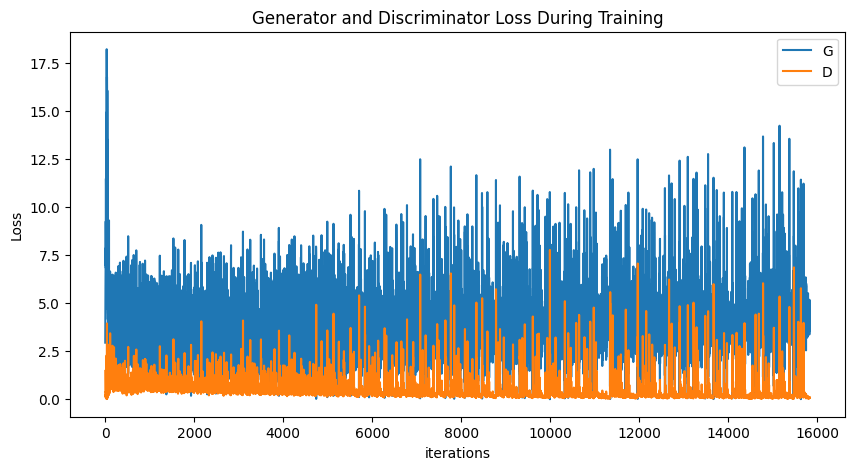

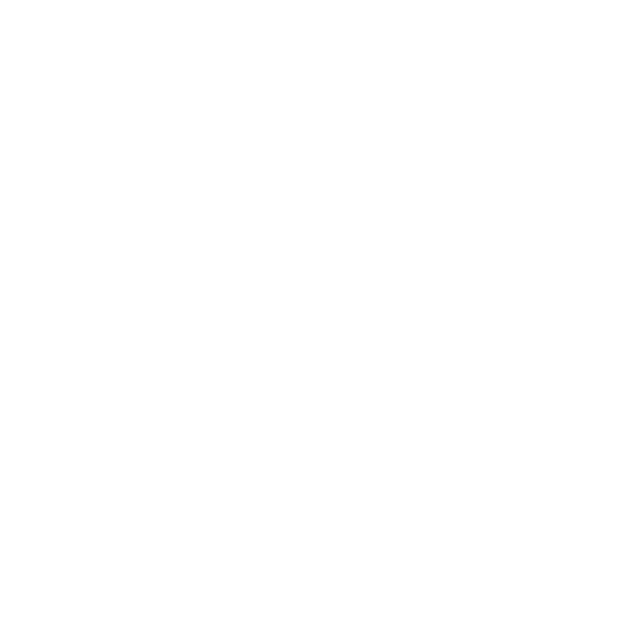

In [5]:
# Create the generator.
netG = Generator(params).to(device)
# Apply the weights_init() function to randomly initialize all
# weights to mean=0.0, stddev=0.2
netG.apply(weights_init)
# Print the model.
print(netG)

# Create the discriminator.  
netD = Discriminator(params).to(device)
# Apply the weights_init() function to randomly initialize all
# weights to mean=0.0, stddev=0.2
netD.apply(weights_init)
# Print the model.
print(netD)

# Binary Cross Entropy loss function.
criterion = nn.BCELoss()

fixed_noise = torch.randn(64, params['nz'], 1, 1, device=device)

real_label = 1.0
fake_label = 0.0

# Optimizer for the discriminator.
optimizerD = optim.Adam(netD.parameters(), lr=params['lr'], betas=(params['beta1'], 0.999))
# Optimizer for the generator.
optimizerG = optim.Adam(netG.parameters(), lr=params['lr'], betas=(params['beta1'], 0.999))

# Stores generated images as training progresses.
img_list = []
# Stores generator losses during training.
G_losses = []
# Stores discriminator losses during training.
D_losses = []

iters = 0

print("Starting Training Loop...")
print("-"*25)

for epoch in range(params['nepochs']):
    for i, data in enumerate(dataloader, 0):
        # Transfer data tensor to GPU/CPU (device)
        real_data = data[0].to(device)
        # Get batch size. Can be different from params['nbsize'] for last batch in epoch.
        b_size = real_data.size(0)
        
        # Make accumalated gradients of the discriminator zero.
        netD.zero_grad()
        # Create labels for the real data. (label=1)
        label = torch.full((b_size, ), real_label, device=device)
        output = netD(real_data).view(-1)
        errD_real = criterion(output, label)
        # Calculate gradients for backpropagation.
        errD_real.backward()
        D_x = output.mean().item()
        
        # Sample random data from a unit normal distribution.
        noise = torch.randn(b_size, params['nz'], 1, 1, device=device)
        # Generate fake data (images).
        fake_data = netG(noise)
        # Create labels for fake data. (label=0)
        label.fill_(fake_label  )
        # Calculate the output of the discriminator of the fake data.
        # As no gradients w.r.t. the generator parameters are to be
        # calculated, detach() is used. Hence, only gradients w.r.t. the
        # discriminator parameters will be calculated.
        # This is done because the loss functions for the discriminator
        # and the generator are slightly different.
        output = netD(fake_data.detach()).view(-1)
        errD_fake = criterion(output, label)
        # Calculate gradients for backpropagation.
        errD_fake.backward()
        D_G_z1 = output.mean().item()

        # Net discriminator loss.
        errD = errD_real + errD_fake
        # Update discriminator parameters.
        optimizerD.step()
        
        # Make accumalted gradients of the generator zero.
        netG.zero_grad()
        # We want the fake data to be classified as real. Hence
        # real_label are used. (label=1)
        label.fill_(real_label)
        # No detach() is used here as we want to calculate the gradients w.r.t.
        # the generator this time.
        output = netD(fake_data).view(-1)
        errG = criterion(output, label)
        # Gradients for backpropagation are calculated.
        # Gradients w.r.t. both the generator and the discriminator
        # parameters are calculated, however, the generator's optimizer
        # will only update the parameters of the generator. The discriminator
        # gradients will be set to zero in the next iteration by netD.zero_grad()
        errG.backward()

        D_G_z2 = output.mean().item()
        # Update generator parameters.
        optimizerG.step()

        # Check progress of training.
        if i%50 == 0:
            print(torch.cuda.is_available())
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, params['nepochs'], i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save the losses for plotting.
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on a fixed noise.
        if (iters % 100 == 0) or ((epoch == params['nepochs']-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake_data = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake_data, padding=2, normalize=True))

        iters += 1

    # Save the model.
    if epoch % params['save_epoch'] == 0:
        torch.save({
            'generator' : netG.state_dict(),
            'discriminator' : netD.state_dict(),
            'optimizerG' : optimizerG.state_dict(),
            'optimizerD' : optimizerD.state_dict(),
            'params' : params
            }, 'model/model_epoch_{}.pth'.format(epoch))

# Save the final trained model.
torch.save({
            'generator' : netG.state_dict(),
            'discriminator' : netD.state_dict(),
            'optimizerG' : optimizerG.state_dict(),
            'optimizerD' : optimizerD.state_dict(),
            'params' : params
            }, 'model/model_final.pth')

# Plot the training losses.
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

# Animation showing the improvements of the generator.
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
anim = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)
plt.show()
anim.save('celeba.gif', dpi=80, writer='imagemagick')

In [6]:
import torch
import torch.nn as nn  
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.datasets as dset
import numpy as np 
import random
device = torch.device("cuda:0" if(torch.cuda.is_available()) else "cpu")

# Define Encoder Architecture
class Encoder(nn.Module):
    def __init__(self, params):
        super(Encoder, self).__init__()
        self.conv1 = nn.Conv2d(params['nc'], params['ndf'], 4, 2, 1, bias=False)
        self.conv2 = nn.Conv2d(params['ndf'], params['ndf']*2, 4, 2, 1, bias=False)
        self.bn2 = nn.BatchNorm2d(params['ndf']*2)
        self.conv3 = nn.Conv2d(params['ndf']*2, params['ndf']*4, 4, 2, 1, bias=False)
        self.bn3 = nn.BatchNorm2d(params['ndf']*4)
        self.conv4 = nn.Conv2d(params['ndf']*4, params['ndf']*8, 4, 2, 1, bias=False)
        self.bn4 = nn.BatchNorm2d(params['ndf']*8)
        self.conv5 = nn.Conv2d(params['ndf']*8, params['nz'], 4, 1, 0, bias=False)

    def forward(self, x):
        x = F.leaky_relu(self.conv1(x), 0.2)
        x = F.leaky_relu(self.bn2(self.conv2(x)), 0.2)
        x = F.leaky_relu(self.bn3(self.conv3(x)), 0.2)
        x = F.leaky_relu(self.bn4(self.conv4(x)), 0.2)
        x = self.conv5(x)
        return x.view(x.size(0), -1)

# Set random seed for reproducibility.
seed = 369
random.seed(seed)
torch.manual_seed(seed)
print("Random Seed:", seed)

# Parameters
params2 = {
    "nc": 3,        # Number of input channels
    "ndf": 64,      # Number of features in the encoder
    "nz": 100 # Size of the latent vector
}

# Initialize Encoder
encoder = Encoder(params2).to(device)

# Define the loss function (Mean Squared Error)
criterion = nn.MSELoss()

# Optimizer for Encoder
encoder_optimizer = optim.Adam(encoder.parameters(), lr=params['lr'], betas=(params['beta1'], 0.999))

# Training Loop
for epoch in range(params['nepochs']):
    for i, data in enumerate(dataloader, 0):
        real_data = data[0].to(device)
        b_size = real_data.size(0)
        
        # Zero the gradients
        encoder.zero_grad()
        
        # Forward pass
        encoded_z = encoder(real_data)
        reconstructed_data = netG(encoded_z.unsqueeze(2).unsqueeze(3))
        
        # Compute the loss
        loss = criterion(reconstructed_data, real_data)
        
        # Backward pass
        loss.backward()
        
        # Update weights
        encoder_optimizer.step()
 

Random Seed: 369


In [7]:
import io
from PIL import Image
import torch
from tensorflow.keras.preprocessing.image import img_to_array

2024-05-01 09:13:57.818546: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-01 09:13:57.818640: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-01 09:13:57.906514: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [18]:
def path_to_tensor(image_path):
        # Create a transform to convert the image to tensor and resize it
        transform = transforms.Compose([
            transforms.Resize((64, 64)),  # Resize the image to 64x64
            transforms.ToTensor()         # Convert the image to a PyTorch tensor
        ])

        # Load the image
        image = Image.open(image_path).convert('RGB')  # Convert to RGB

        # Apply the transform to the image
        tensor_image = transform(image)

        # Check the size to confirm it is [3, 64, 64]
        print(tensor_image.size())
        return tensor_image

In [8]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'output' is the tensor from the generator
# Normalize from [-1, 1] to [0, 1]
def translated_to_image(translated_images):
    output = translated_images[0]
    output = (output + 1) / 2.0

    # Assuming the output tensor shape is [1, 3, 64, 64] and you want to display the first image in the batch
    image_to_display = output[0]  # Get the first image in the batch

    # Convert to NumPy array and transpose the axes from (C, H, W) to (H, W, C) for image display
    image_to_display = image_to_display.detach().cpu().numpy()  # Detach and move to cpu
    image_to_display = np.transpose(image_to_display, (1, 2, 0))  # Transpose the dimensions
    return image_to_display

In [107]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Vector Arithmetics in 'z space'
def vector_arithmetics_z_space1(z_vectors):
    # Define the operations for each arithmetic
    operations = [
        #lambda x: image_to_pixels(tensor_to_pil_image(x[0])) - image_to_pixels(tensor_to_pil_image(x[1])) + image_to_pixels(tensor_to_pil_image(x[2]))
        lambda x: ((x[0]+x[1]+x[2]) +(x[3]+x[4]+x[5]) - (x[6]+x[7]+x[8]) + (x[9]+x[10]+x[11])-(x[12]+x[13]+x[14]))/3.0
    ]

    results = []
    for operation in operations:
        result = operation(z_vectors)
        results.append(result)
    return results
def vector_arithmetics_z_space2(z_vectors):
    # Define the operations for each arithmetic
    operations = [
        #lambda x: image_to_pixels(tensor_to_pil_image(x[0])) - image_to_pixels(tensor_to_pil_image(x[1])) + image_to_pixels(tensor_to_pil_image(x[2]))
        lambda x: ((x[0]+x[1]+x[2]) +(x[3]+x[4]+x[5]) - (x[6]+x[7]+x[8]))/3.0
    ]

    results = []
#     results =results + z_vectors
#     results.append((x[0]+x[1]+x[2])/3.0)
#     results.append((x[4]+x[5]+x[6])/3.0)
#     results.append((x[7]+x[8]+x[9])/3.0)
    for operation in operations:
        result = operation(z_vectors)
        results.append(result)
    return results

# Vector Arithmetics in input image space
def vector_arithmetics_image_space1(images, encoder):
    # Encode input images to get z vectors
    # Move your data to the same device as the model
    device = next(encoder.parameters()).device
    images = images.to(device)
    encoded_z = encoder(images)
    avg=get_avg_images(encoded_z)
    # Perform vector arithmetics in 'z space'
    z_results = vector_arithmetics_z_space1(encoded_z)+avg
    # Perform vector arithmetics in 'z space'
    translated_images = []
    for result in z_results:
        print("result=",result.shape)
        result=result.unsqueeze(0).unsqueeze(2).unsqueeze(3)
        translated_image = netG(result)
        translated_images.append(translated_image)
    
    return translated_images,z_results

def vector_arithmetics_image_space2(images, encoder):
    # Encode input images to get z vectors
    # Move your data to the same device as the model
    device = next(encoder.parameters()).device
    images = images.to(device)
    encoded_z = encoder(images)
    avg=get_avg_images(encoded_z)
    # Perform vector arithmetics in 'z space'
    z_results = vector_arithmetics_z_space2(encoded_z)+avg
    translated_images = []
    for result in z_results:
        print("result=",result.shape)
        result=result.unsqueeze(0).unsqueeze(2).unsqueeze(3)
        translated_image = netG(result)
        translated_images.append(translated_image)
    
    return translated_images,z_results


In [86]:
res[0].shape

torch.Size([100])

In [10]:
# Vector Arithmetics in 'z space'
def img_arithmetics_z_space1(z_vectors):
    # Define the operations for each arithmetic
    operations = [
        #lambda x: image_to_pixels(tensor_to_pil_image(x[0])) - image_to_pixels(tensor_to_pil_image(x[1])) + image_to_pixels(tensor_to_pil_image(x[2]))
        lambda x: ((x[0][0]+x[0][1]+x[0][2]) +(x[1][0]+x[1][1]+x[1][2]) - (x[2][0]+x[2][1]+x[2][2]) + (x[3][0]+x[3][1]+x[3][2])-(x[4][0]+x[4][1]+x[4][2]))/3.0
    ]

    results = []
    for operation in operations:
        result = operation(z_vectors)
        results.append(result)
    return results

def img_arithmetics_z_space1(z_vectors):
    # Define the operations for each arithmetic
    operations = [
        #lambda x: image_to_pixels(tensor_to_pil_image(x[0])) - image_to_pixels(tensor_to_pil_image(x[1])) + image_to_pixels(tensor_to_pil_image(x[2]))
        lambda x: ((x[0][0]+x[0][1]+x[0][2]) +(x[1][0]+x[1][1]+x[1][2]) - (x[2][0]+x[2][1]+x[2][2]))/3.0
    ]

    results = []
    for operation in operations:
        result = operation(z_vectors)
        results.append(result)
    return results

def image_arithmetics(images, encoder):
    final_imgs=img_arithmetics_z_space1(images)
    device = next(encoder.parameters()).device
    final_imgs=torch.stack(final_imgs,dim=0)
    final_imgs = final_imgs.to(device)
    encoded_imgs = encoder(final_imgs)
    translated_images = []
    for result in encoded_imgs:
#         print("result=",result.shape)
        result=result.unsqueeze(0).unsqueeze(2).unsqueeze(3)
        translated_image = netG(result)
        translated_images.append(translated_image)
    
    return translated_images
    
    

In [44]:
def get_avg_images(imgs):
    # Define the operations for each arithmetic
#     operations = [
#         #lambda x: image_to_pixels(tensor_to_pil_image(x[0])) - image_to_pixels(tensor_to_pil_image(x[1])) + image_to_pixels(tensor_to_pil_image(x[2]))
#         lambda x: ((x[0]+x[1]+x[2]) +(x[3]+x[4]+x[5]) - (x[6]+x[7]+x[8]))/3.0
#     ]
    results=[]
    j=0
    for i in range(len(imgs)//3):
        results.append((imgs[j]+imgs[j+1]+imgs[j+2])/3.0)
        j=j+3
#     for operation in operations:
#         result = operation(z_vectors)
#         results.append(result)
    return results

In [41]:
len(sampled_tensors1)

9

In [11]:
import os
import csv
import shutil

def load_celeba_dataset(dataset_dir, output_dir, max_images=100):
    categories = ['men_with_glasses', 'men_without_glasses', 'women_with_glasses', 
                  'women_without_glasses', 'smiling_men', 'people_with_hat', 
                  'people_without_hat', 'people_with_mustache', 'people_without_mustache','people_with_glasses','people_without_glasses']
    dataset = {category: [] for category in categories}
    counts = {category: 0 for category in categories}

    # Read attributes from CSV file
    attr_file_path = os.path.join(dataset_dir, 'list_attr_celeba.csv')
    with open(attr_file_path, 'r') as f:
        reader = csv.reader(f)
        attributes = next(reader)[1:]  # Skip first column (filename)

        for row in reader:
            if all(counts[category] >= max_images for category in categories):
                break  # Stop loading once all categories have enough images

            filename = row[0]
            attr_values = row[1:]
            img_path = os.path.join(dataset_dir, 'img_align_celeba/img_align_celeba', filename)

            is_male = int(attr_values[attributes.index('Male')]) == 1
            has_glasses = int(attr_values[attributes.index('Eyeglasses')]) == 1
            has_hat = int(attr_values[attributes.index('Wearing_Hat')]) == 1
            has_mustache = int(attr_values[attributes.index('Mustache')]) == 1
            is_smiling = int(attr_values[attributes.index('Smiling')]) == 1

            # Determine categories based on attributes
            if has_glasses and counts['people_with_glasses'] < max_images:
                    dataset['people_with_glasses'].append(img_path)
                    counts['people_with_glasses'] += 1
            if not has_glasses and counts['people_without_glasses'] < max_images:
                    dataset['people_without_glasses'].append(img_path)
                    counts['people_without_glasses'] += 1
            if is_male:
                if has_glasses and counts['men_with_glasses'] < max_images:
                    dataset['men_with_glasses'].append(img_path)
                    counts['men_with_glasses'] += 1
                elif not has_glasses and counts['men_without_glasses'] < max_images:
                    dataset['men_without_glasses'].append(img_path)
                    counts['men_without_glasses'] += 1
                if is_smiling and counts['smiling_men'] < max_images:
                    dataset['smiling_men'].append(img_path)
                    counts['smiling_men'] += 1
            else:  # Women
                if has_glasses and counts['women_with_glasses'] < max_images:
                    dataset['women_with_glasses'].append(img_path)
                    counts['women_with_glasses'] += 1
                elif not has_glasses and counts['women_without_glasses'] < max_images:
                    dataset['women_without_glasses'].append(img_path)
                    counts['women_without_glasses'] += 1

            if has_hat and counts['people_with_hat'] < max_images:
                dataset['people_with_hat'].append(img_path)
                counts['people_with_hat'] += 1
            elif not has_hat and counts['people_without_hat'] < max_images:
                dataset['people_without_hat'].append(img_path)
                counts['people_without_hat'] += 1

            if has_mustache and counts['people_with_mustache'] < max_images:
                dataset['people_with_mustache'].append(img_path)
                counts['people_with_mustache'] += 1
            elif not has_mustache and counts['people_without_mustache'] < max_images:
                dataset['people_without_mustache'].append(img_path)
                counts['people_without_mustache'] += 1

    # Create directories and move images
    for category in categories:
        train_path = os.path.join(output_dir, category, 'train')
        test_path = os.path.join(output_dir, category, 'test')
        os.makedirs(train_path, exist_ok=True)
        os.makedirs(test_path, exist_ok=True)

        split_ratio = 0.8  # Adjust this ratio as needed
        train_size = int(len(dataset[category]) * split_ratio)
        train, test = dataset[category][:train_size], dataset[category][train_size:]

        for img_path in train:
            shutil.copy(img_path, os.path.join(train_path, os.path.basename(img_path)))
        for img_path in test:
            shutil.copy(img_path, os.path.join(test_path, os.path.basename(img_path)))

    return dataset

# Example usage
dataset_dir = '/kaggle/input/celeba-dataset/'
output_dir = '/kaggle/working/'  # Adjust this to your desired output directory
celeba_dataset = load_celeba_dataset(dataset_dir, output_dir, max_images=100)


In [124]:
# Function to sample images for vector arithmetic
def sample_images_from_categories(dataset, categories, num_samples=30):
    category_samples = []
    for category in categories:
        category_images = dataset[category]
        print(f"Found {len(category_images)} entries for category '{category}'.")
        
        if len(category_images) < num_samples:
            print(f"Not enough samples available for '{category}'. Needed {num_samples}, found {len(category_images)}.")
            continue
        
        sampled_images = random.sample(category_images, num_samples)
        category_samples.append(sampled_images)
    
    return category_samples

# Sample images from each category for vector arithmetics
sampled_images11 = sample_images_from_categories(celeba_dataset, categories=["men_without_glasses", "people_without_glasses","people_with_glasses"])
sampled_images21 = sample_images_from_categories(celeba_dataset, categories=["men_with_glasses", "men_without_glasses","women_without_glasses"])
sampled_images31 = sample_images_from_categories(celeba_dataset, categories=["smiling_men", "people_with_hat","people_without_hat","people_with_mustache","people_without_mustache"])

Found 100 entries for category 'men_without_glasses'.
Found 100 entries for category 'people_without_glasses'.
Found 100 entries for category 'people_with_glasses'.
Found 100 entries for category 'men_with_glasses'.
Found 100 entries for category 'men_without_glasses'.
Found 100 entries for category 'women_without_glasses'.
Found 100 entries for category 'smiling_men'.
Found 100 entries for category 'people_with_hat'.
Found 100 entries for category 'people_without_hat'.
Found 100 entries for category 'people_with_mustache'.
Found 100 entries for category 'people_without_mustache'.


torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])


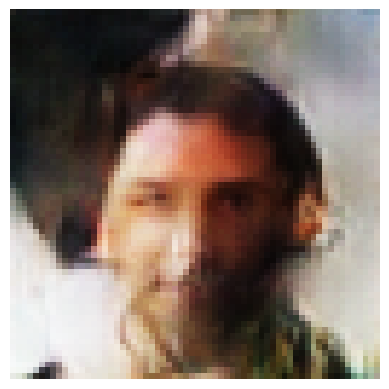

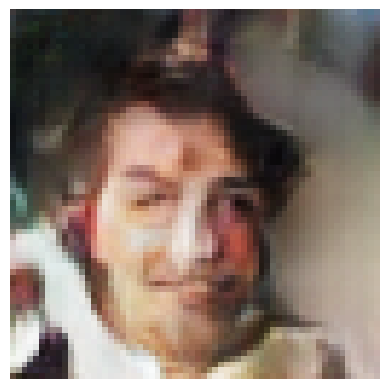

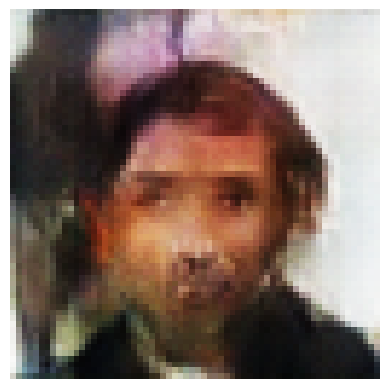

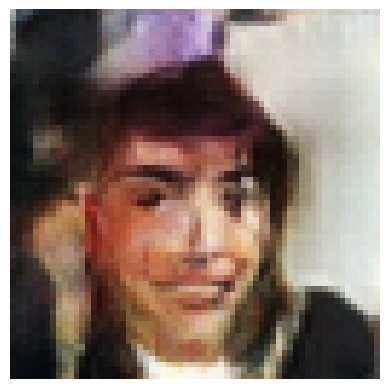

result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])


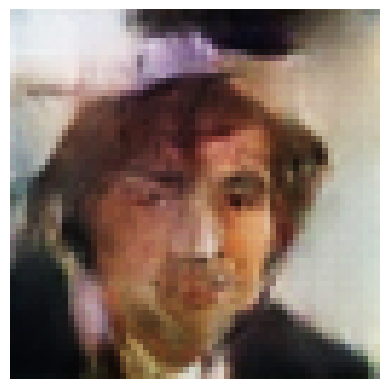

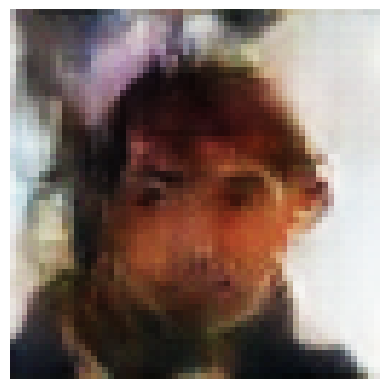

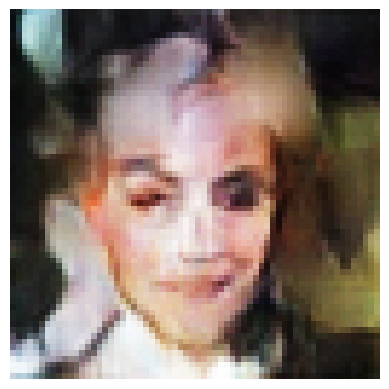

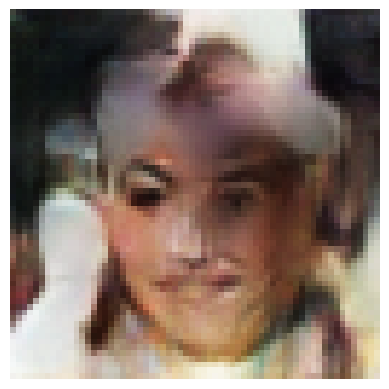

result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])


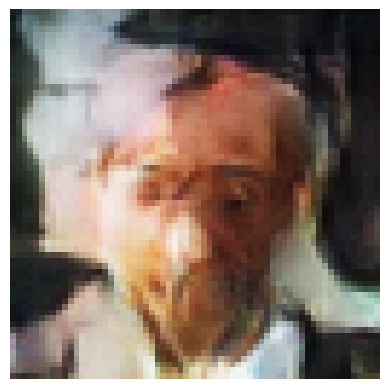

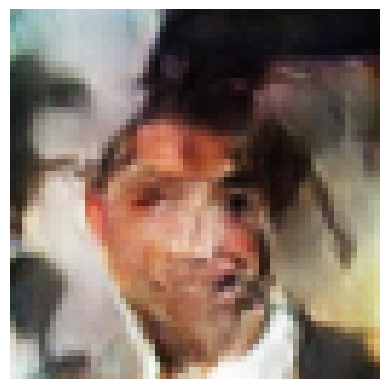

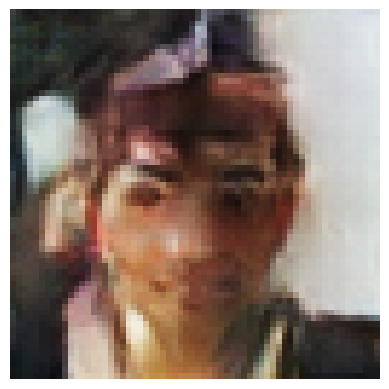

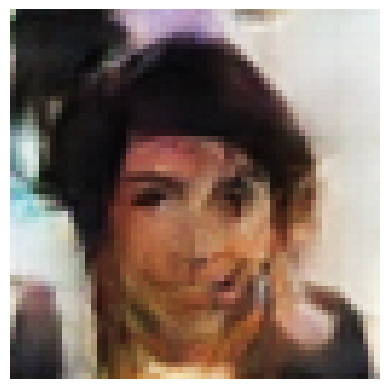

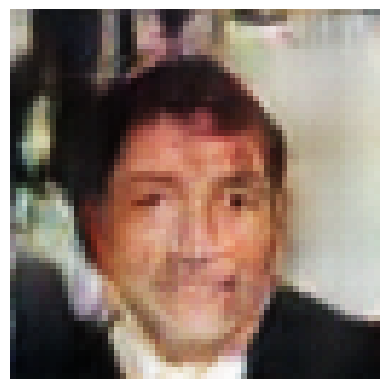

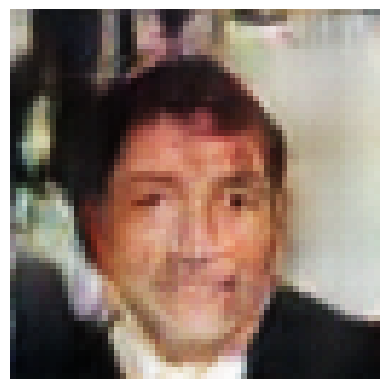

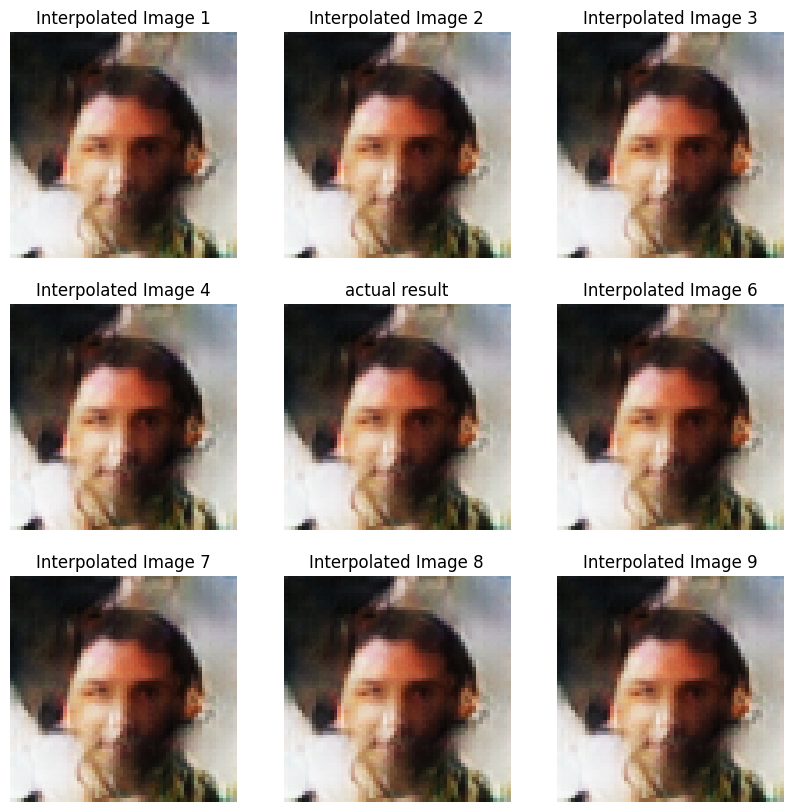

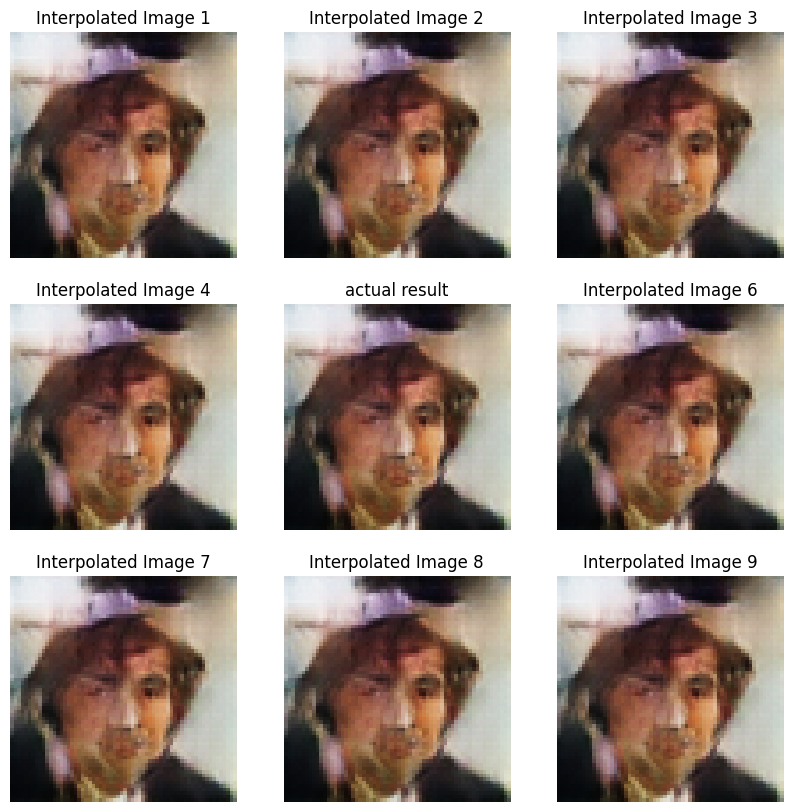

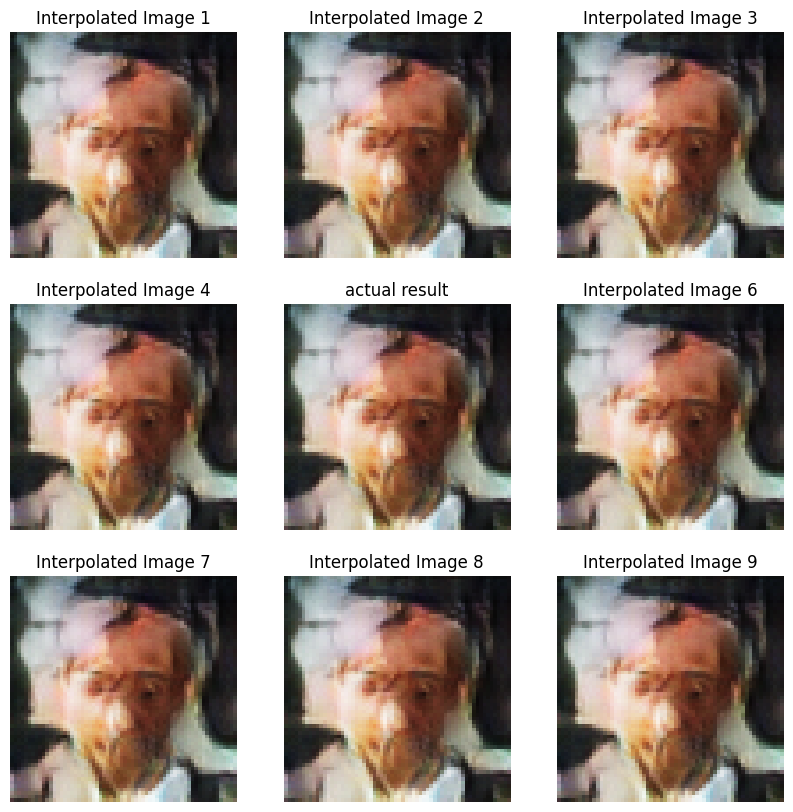

torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])


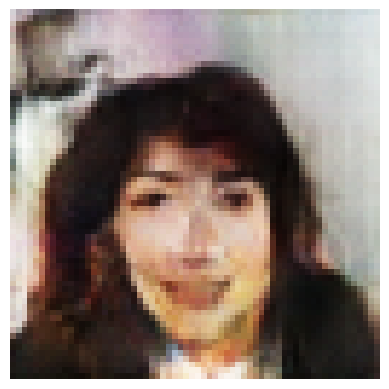

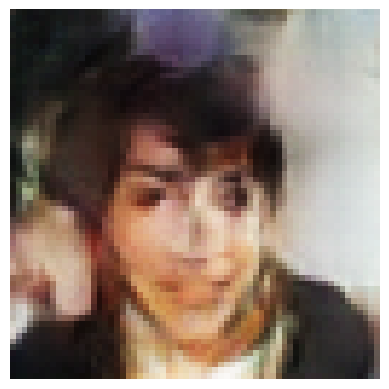

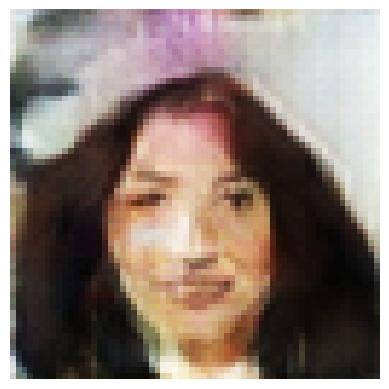

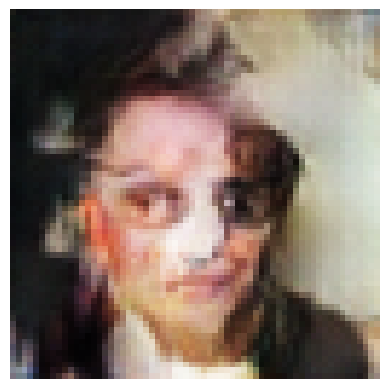

result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])


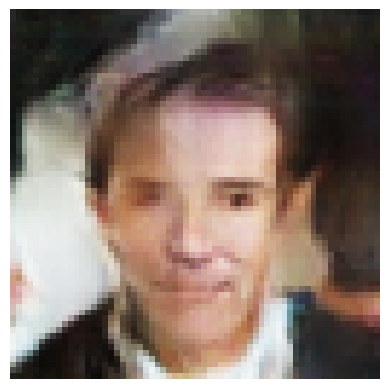

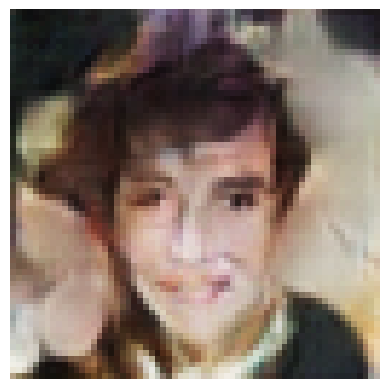

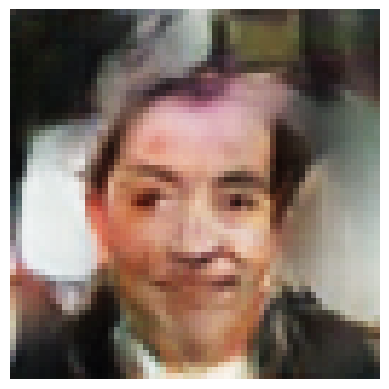

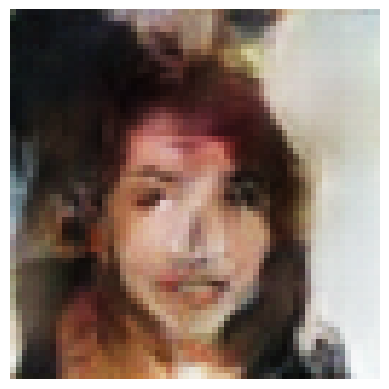

result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])


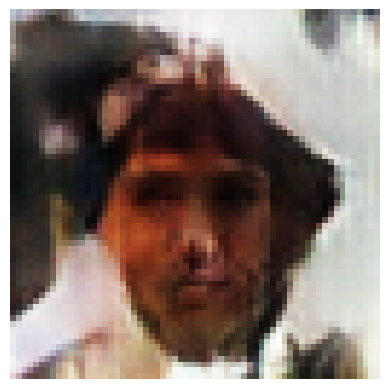

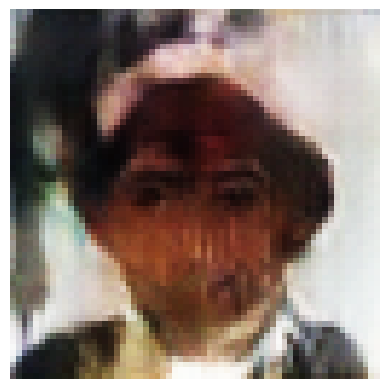

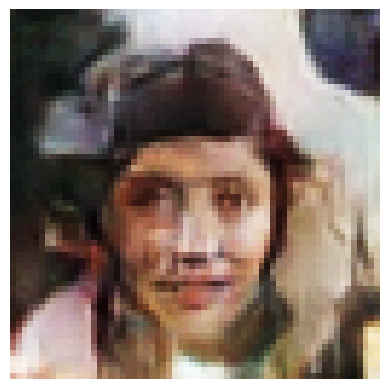

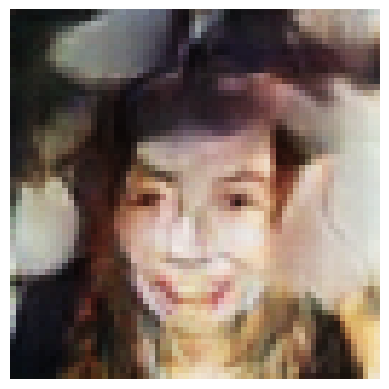

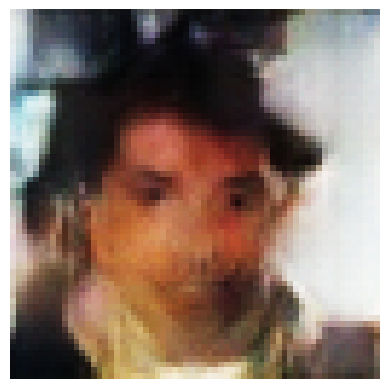

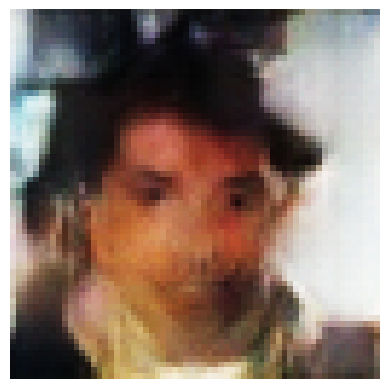

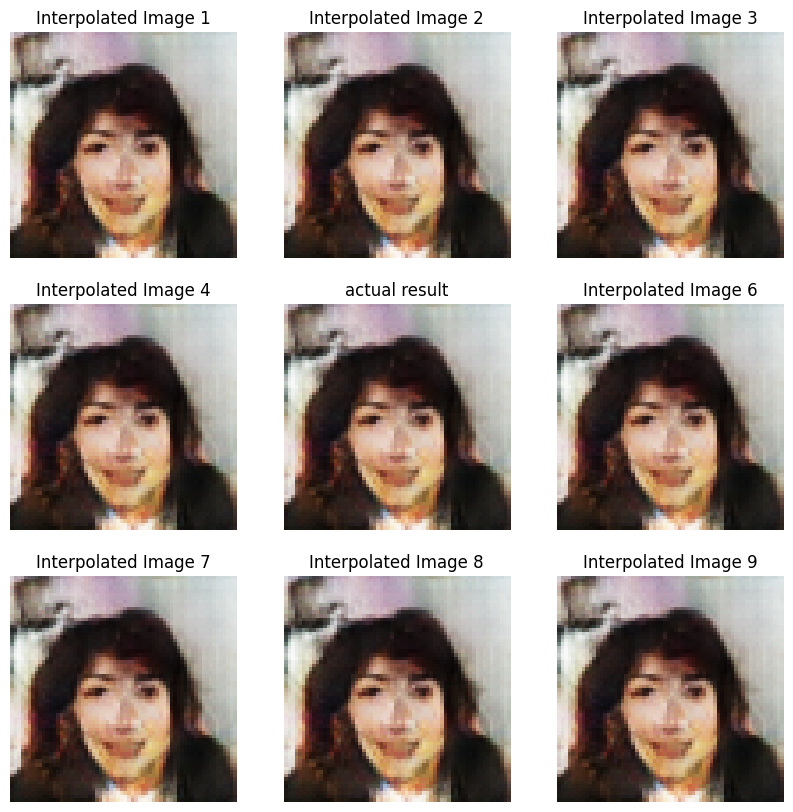

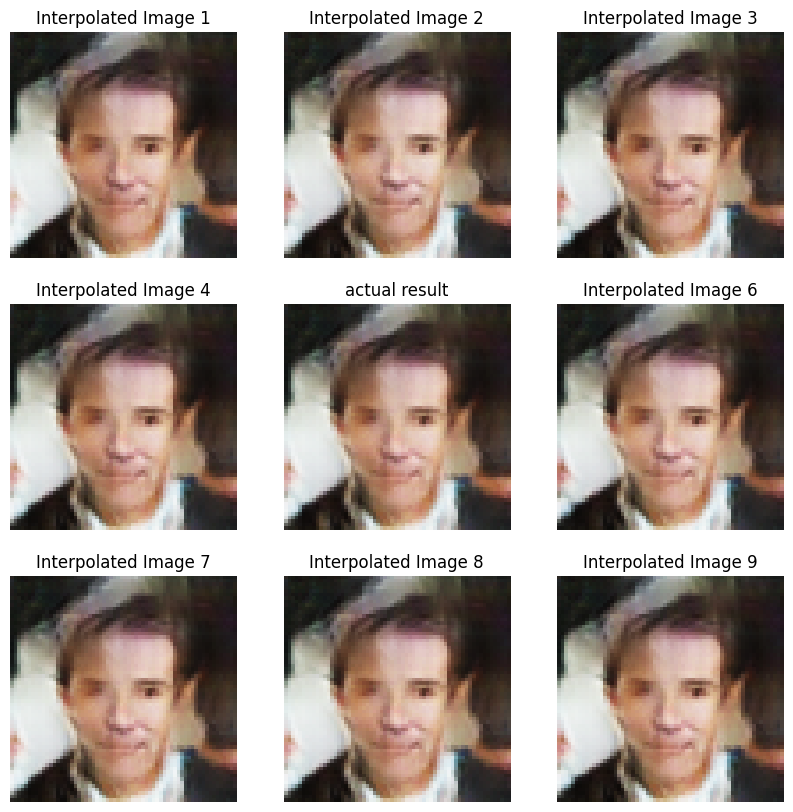

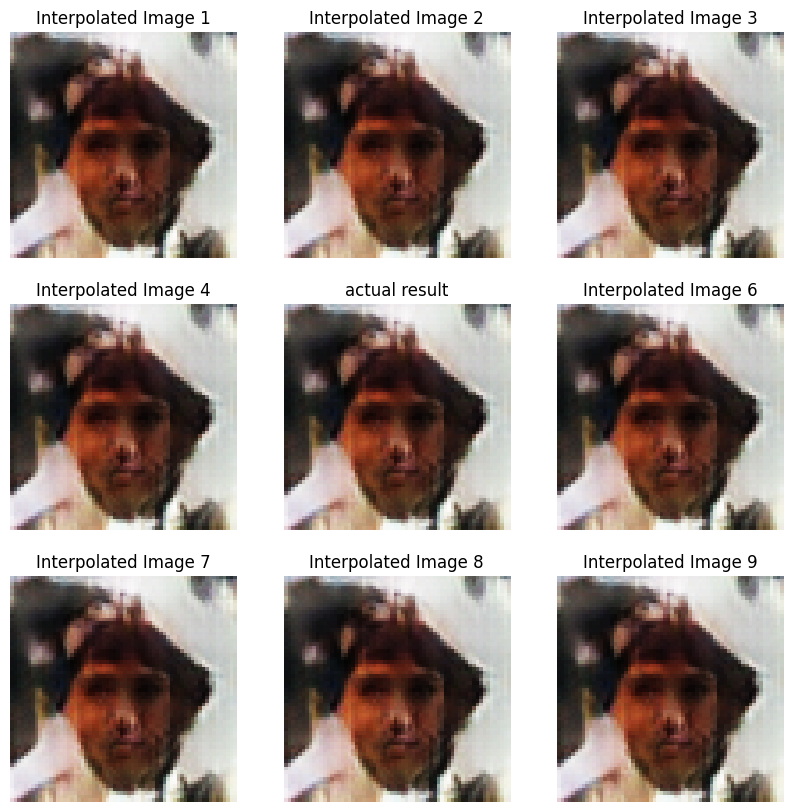

torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])


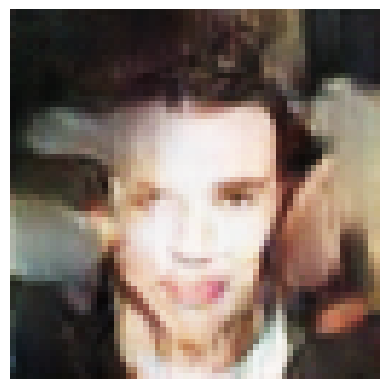

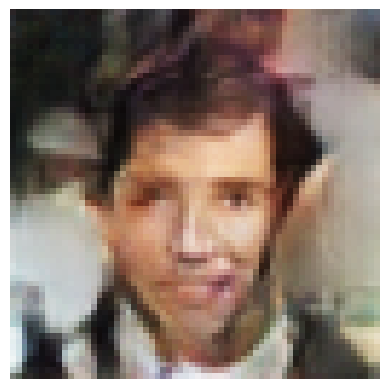

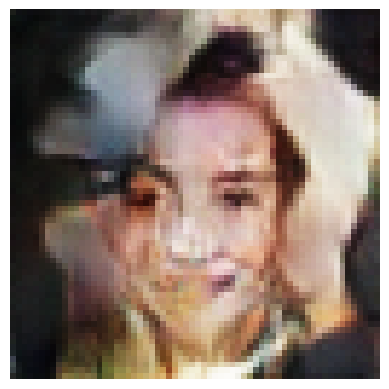

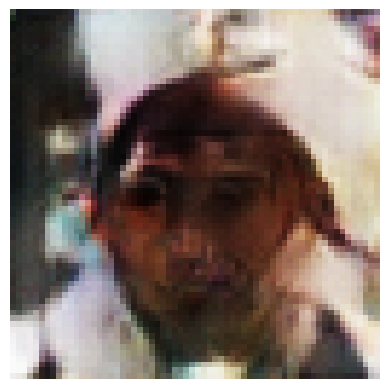

result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])


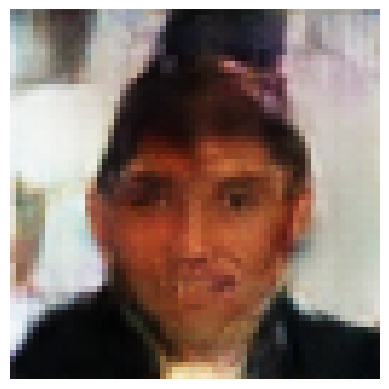

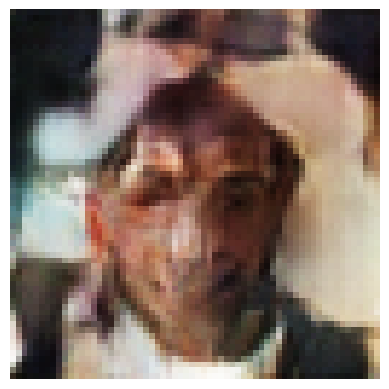

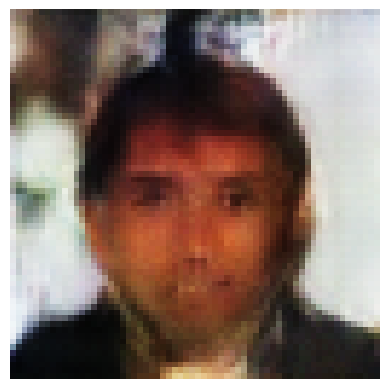

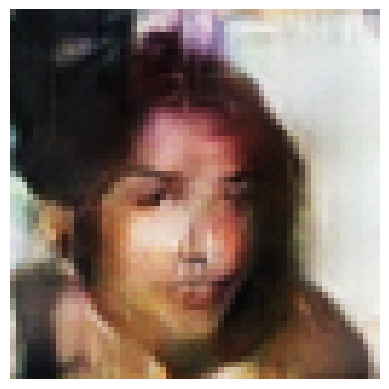

result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])


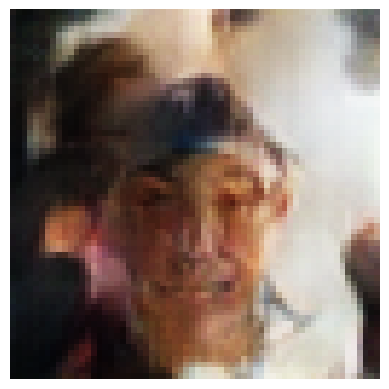

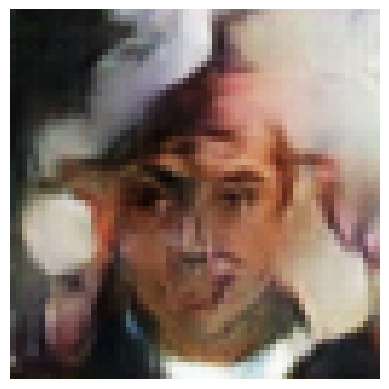

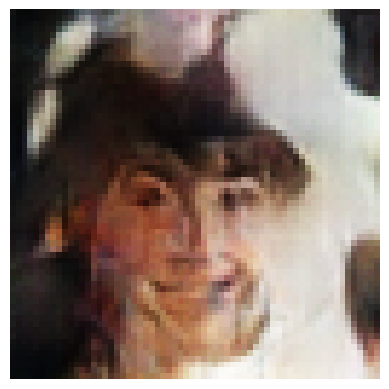

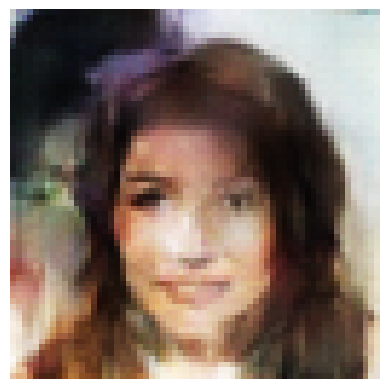

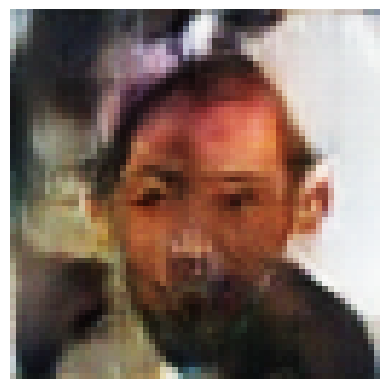

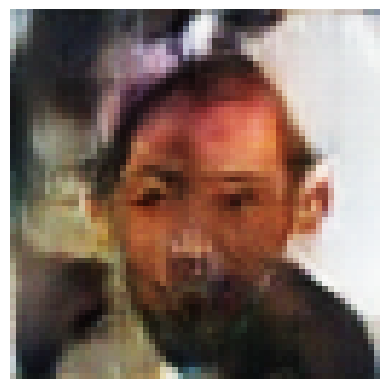

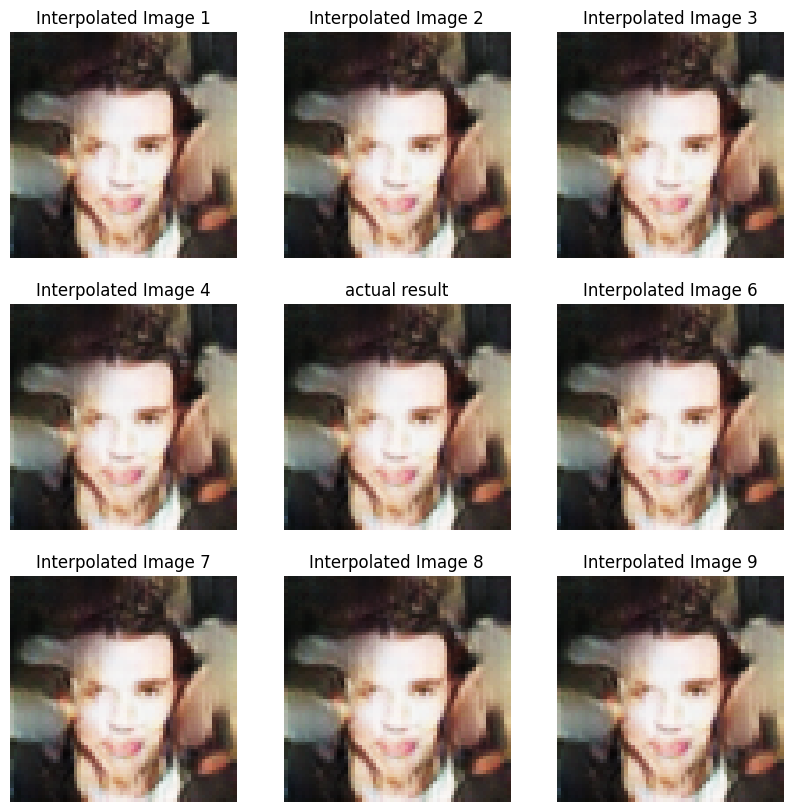

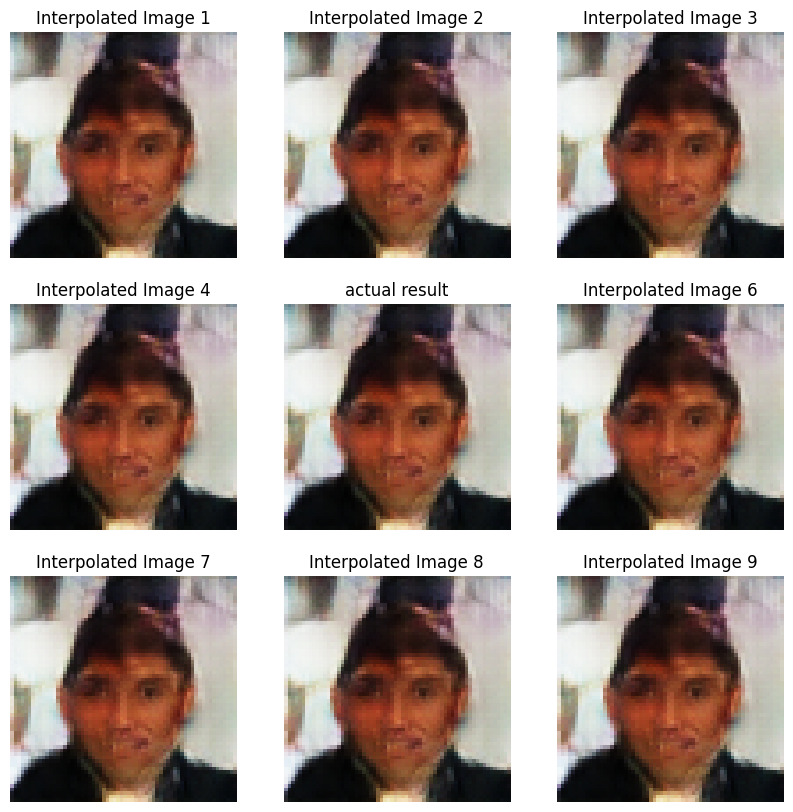

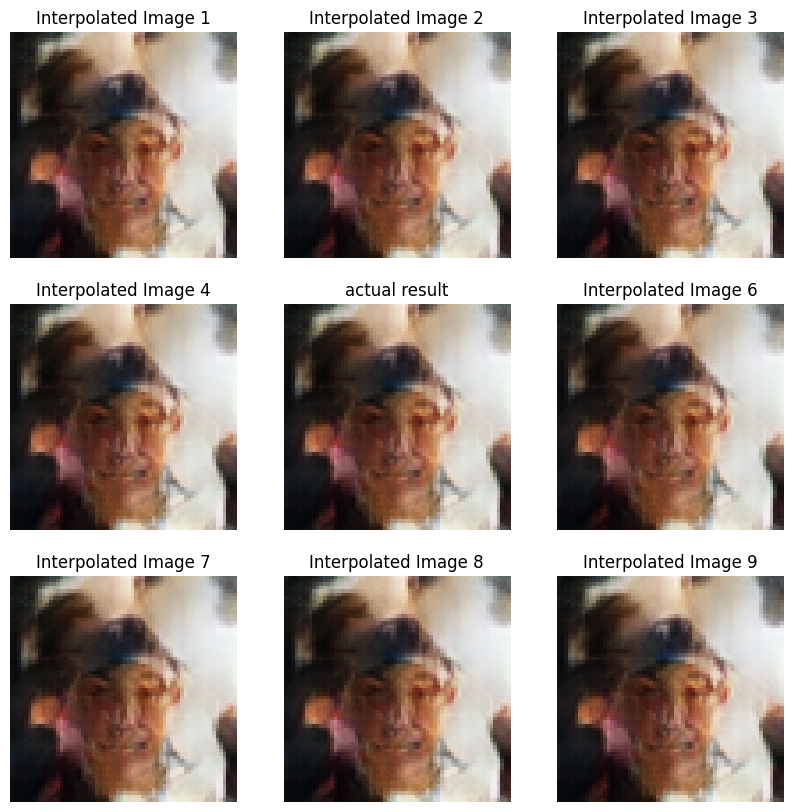

torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])


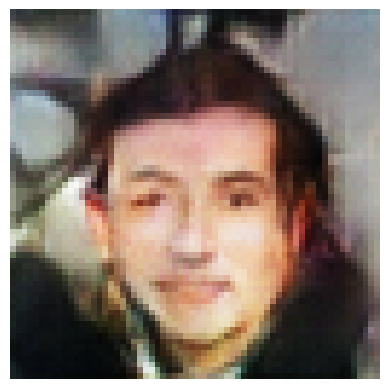

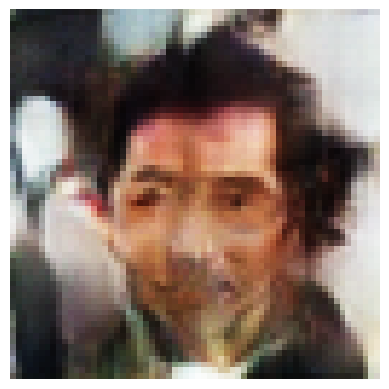

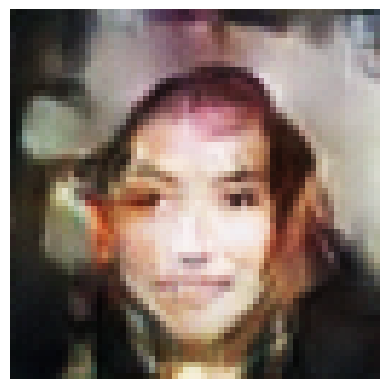

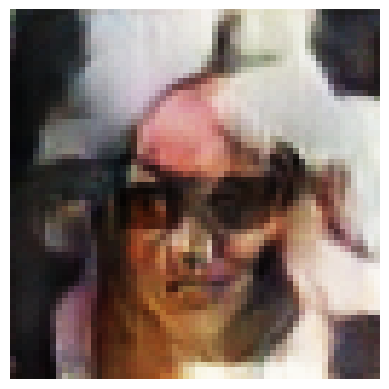

result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])


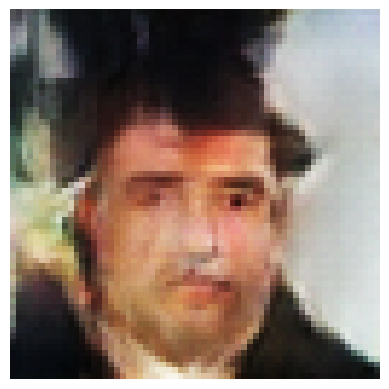

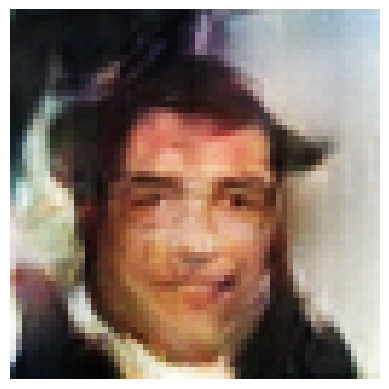

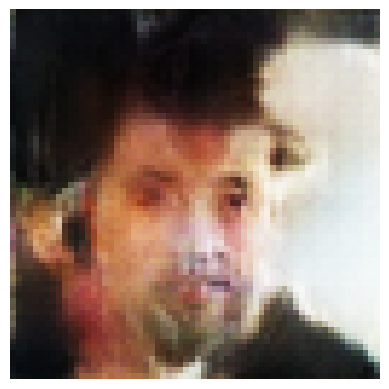

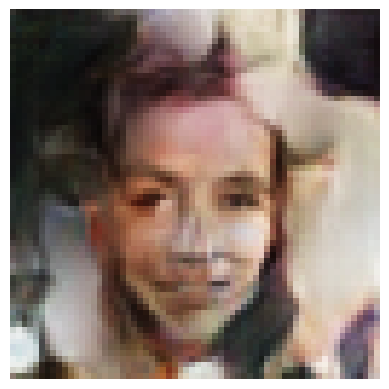

result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])


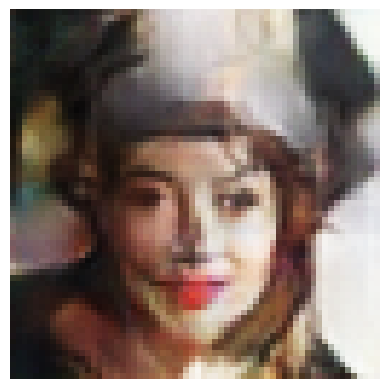

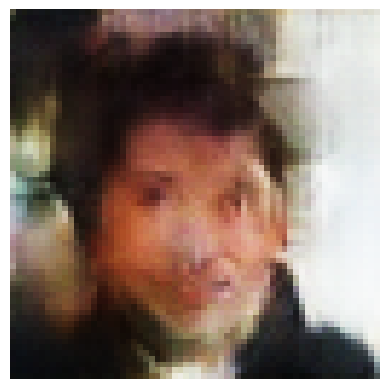

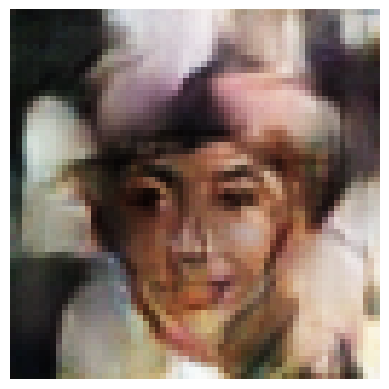

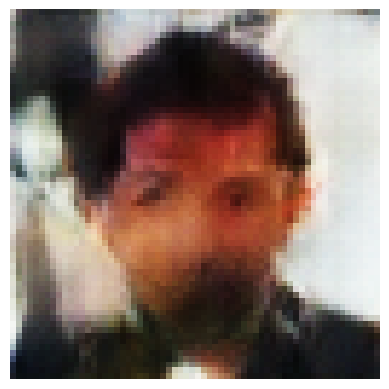

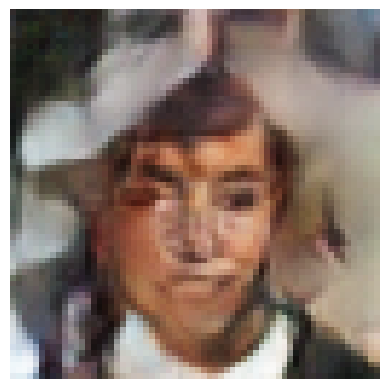

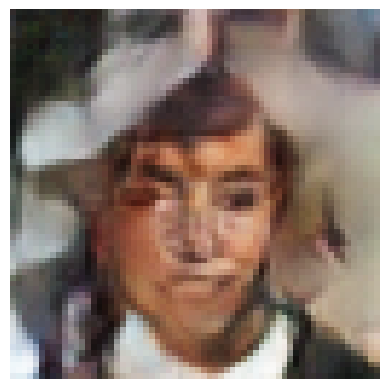

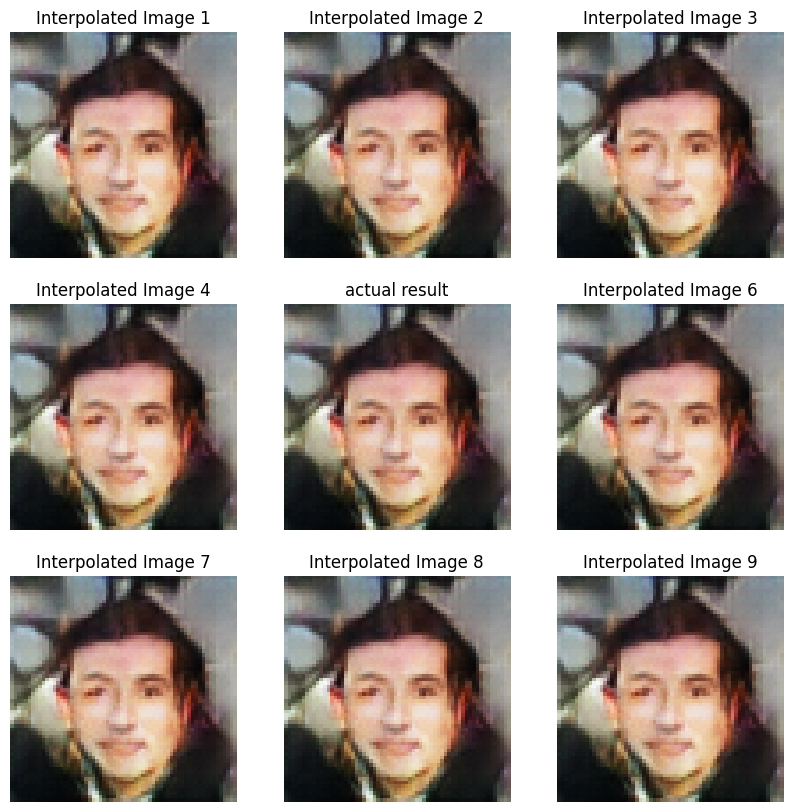

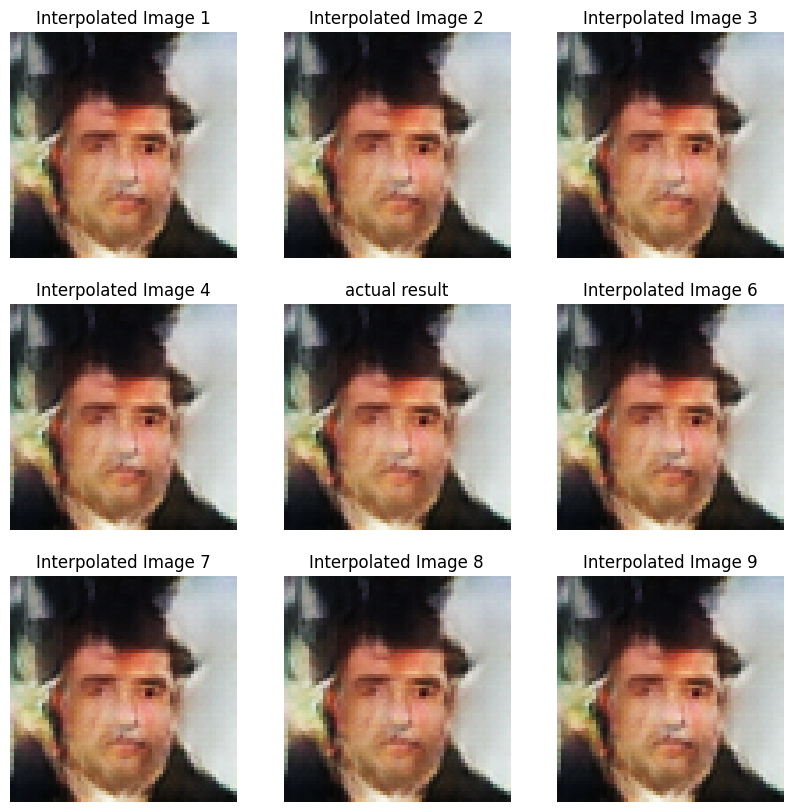

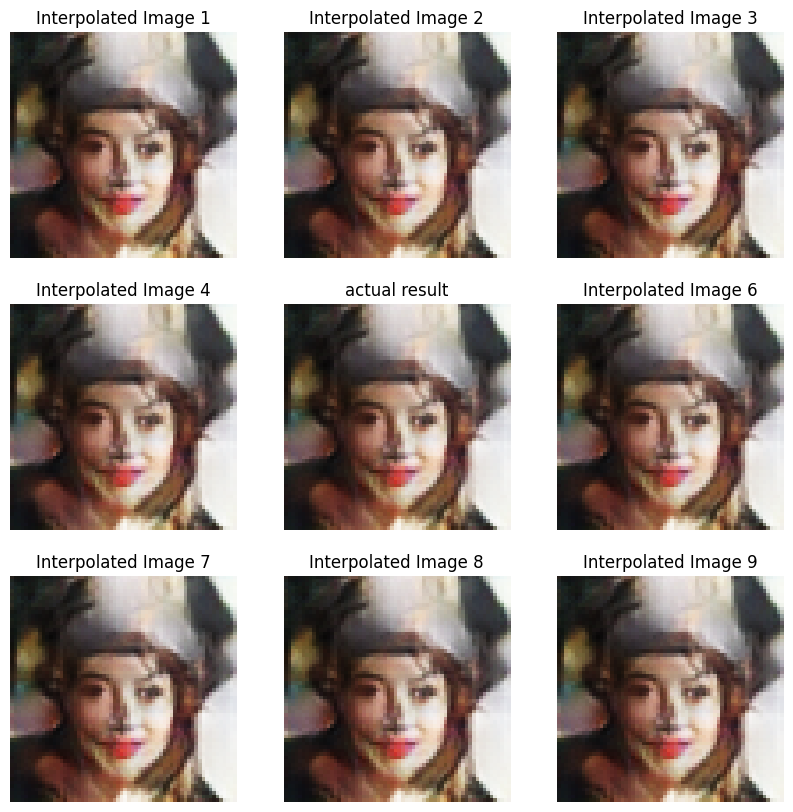

torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])


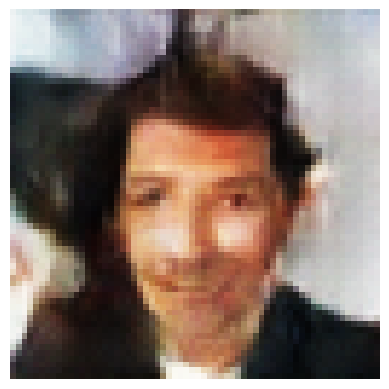

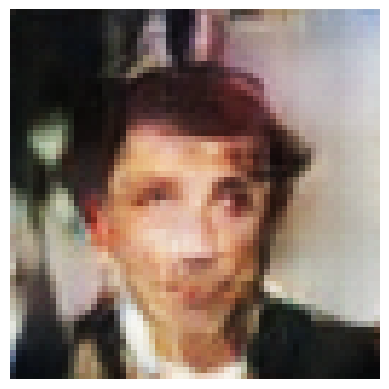

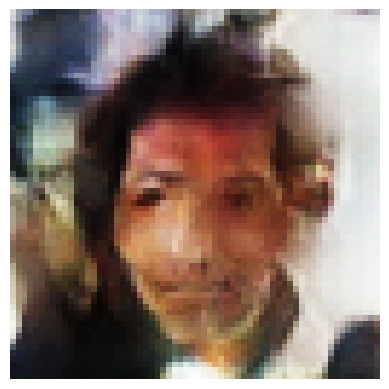

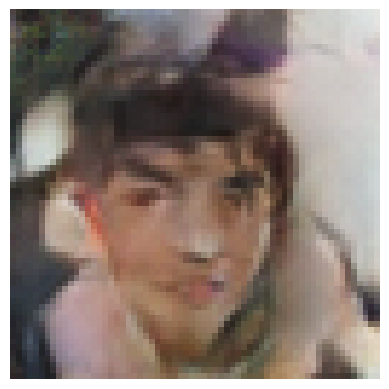

result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])


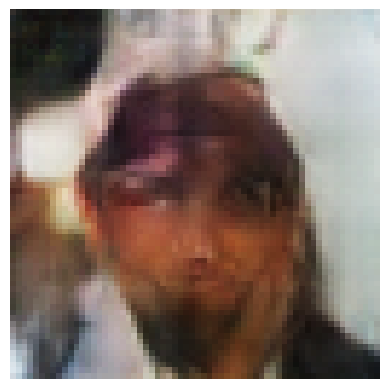

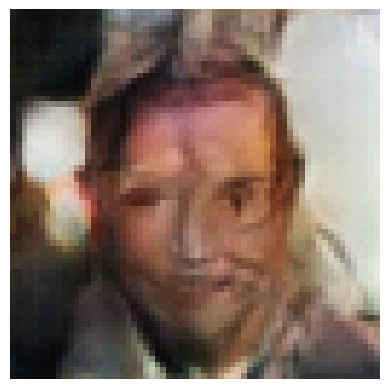

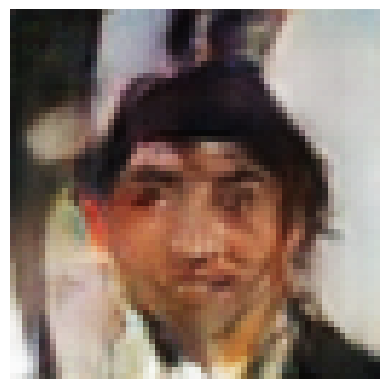

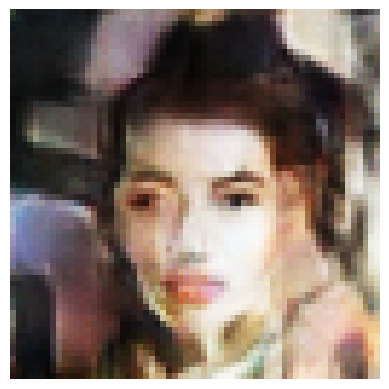

result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])


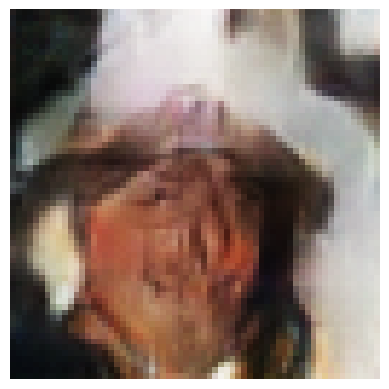

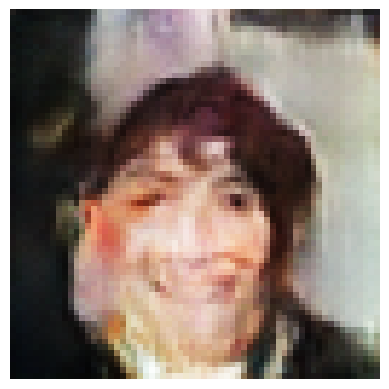

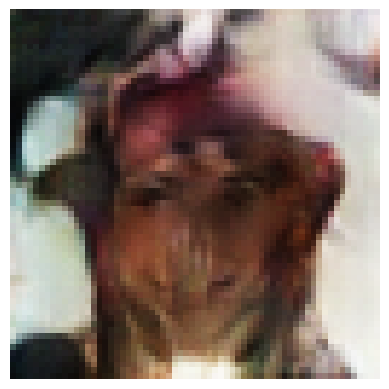

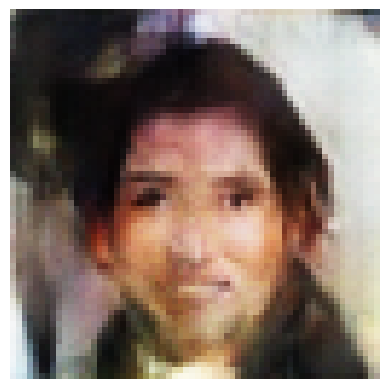

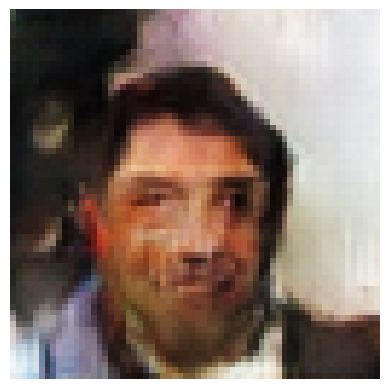

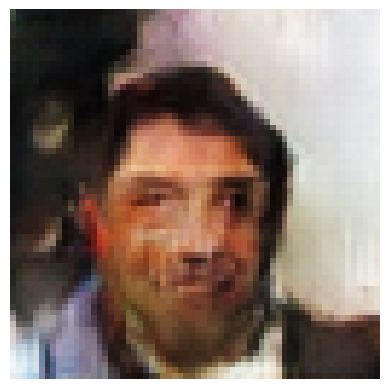

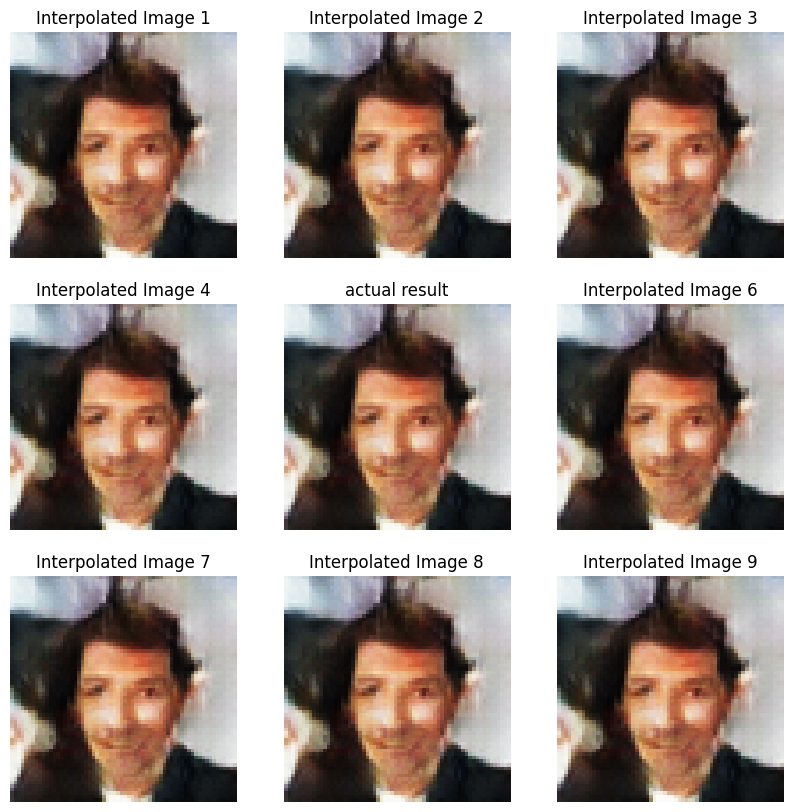

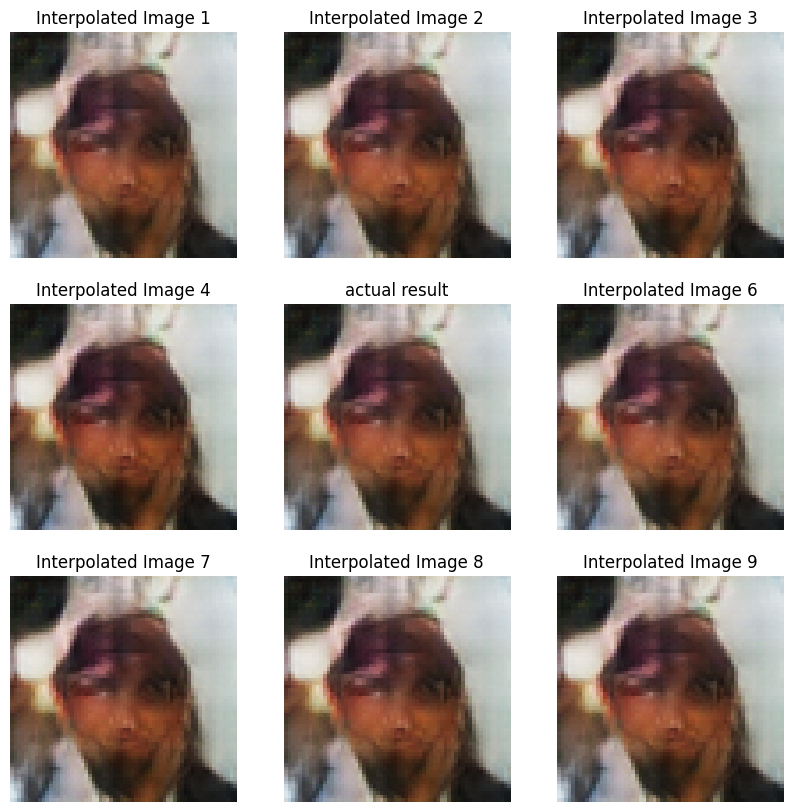

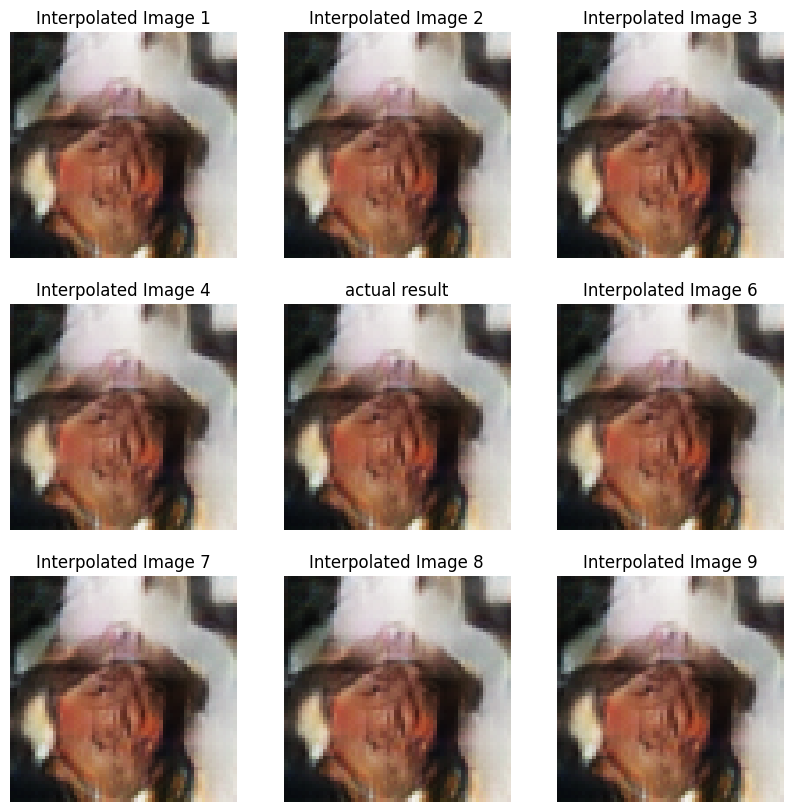

torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])


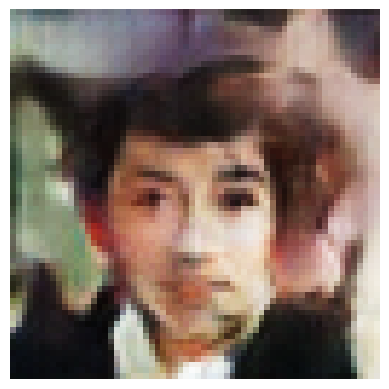

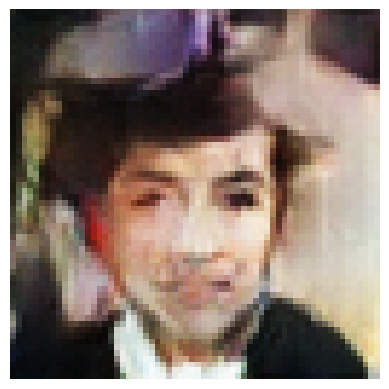

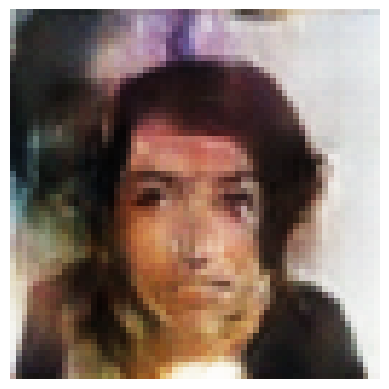

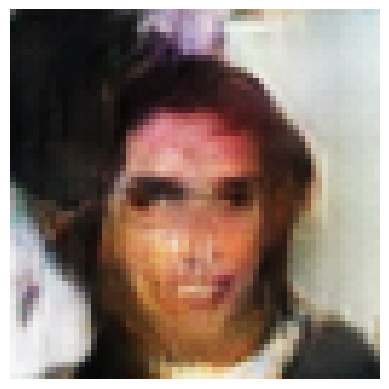

result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])


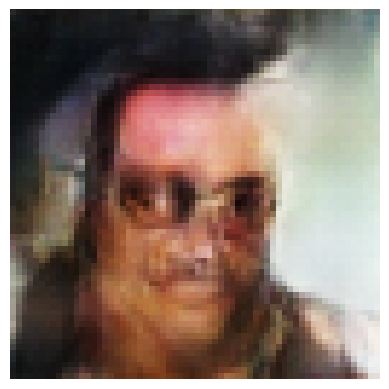

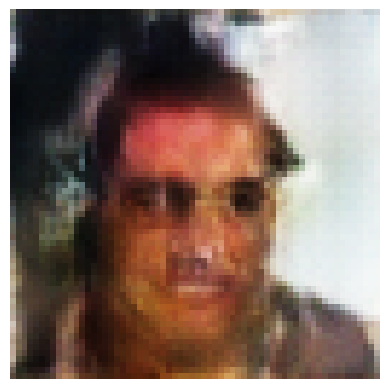

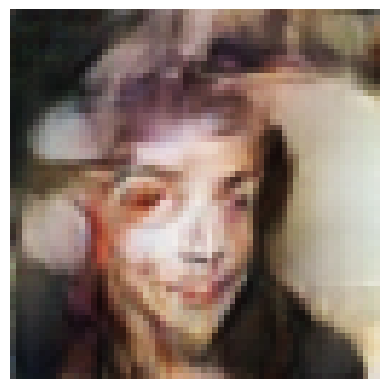

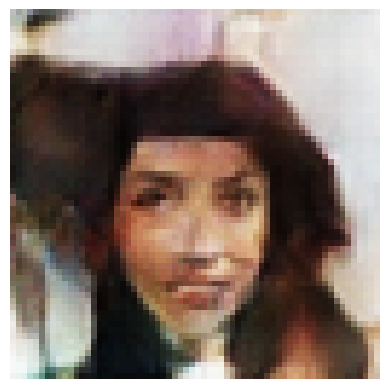

result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])


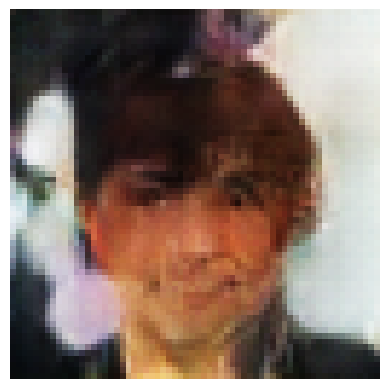

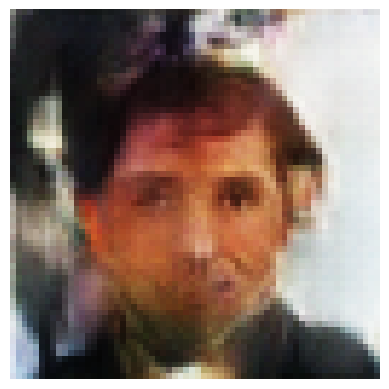

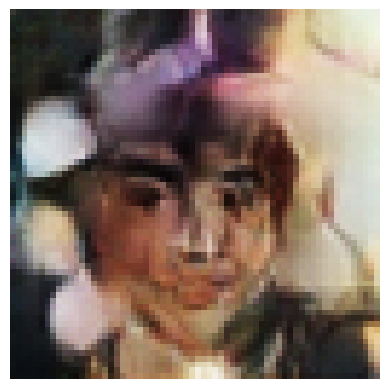

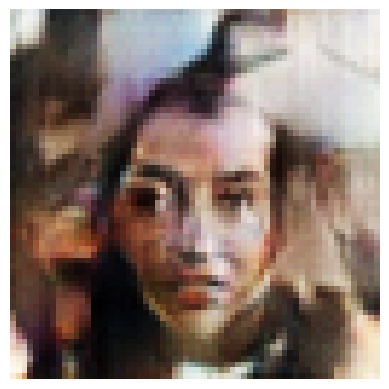

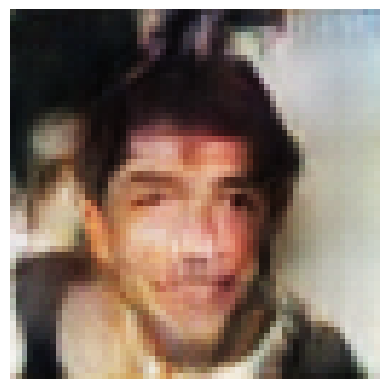

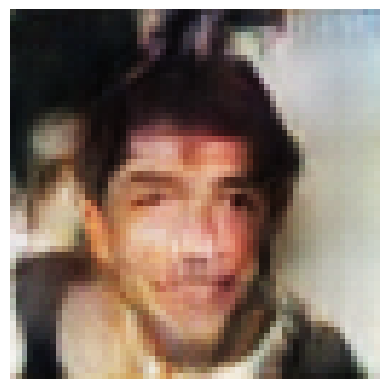

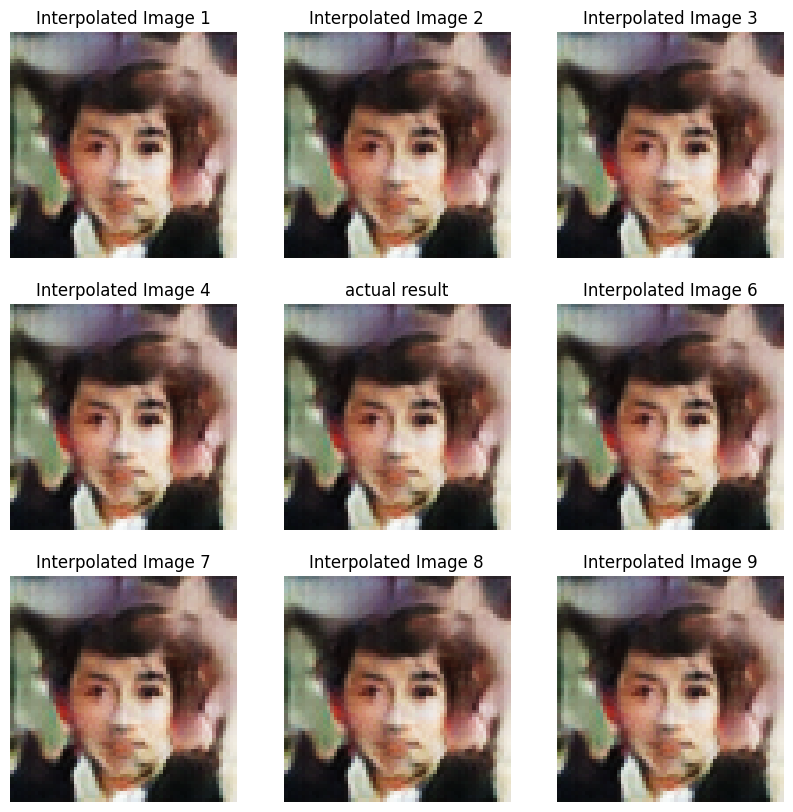

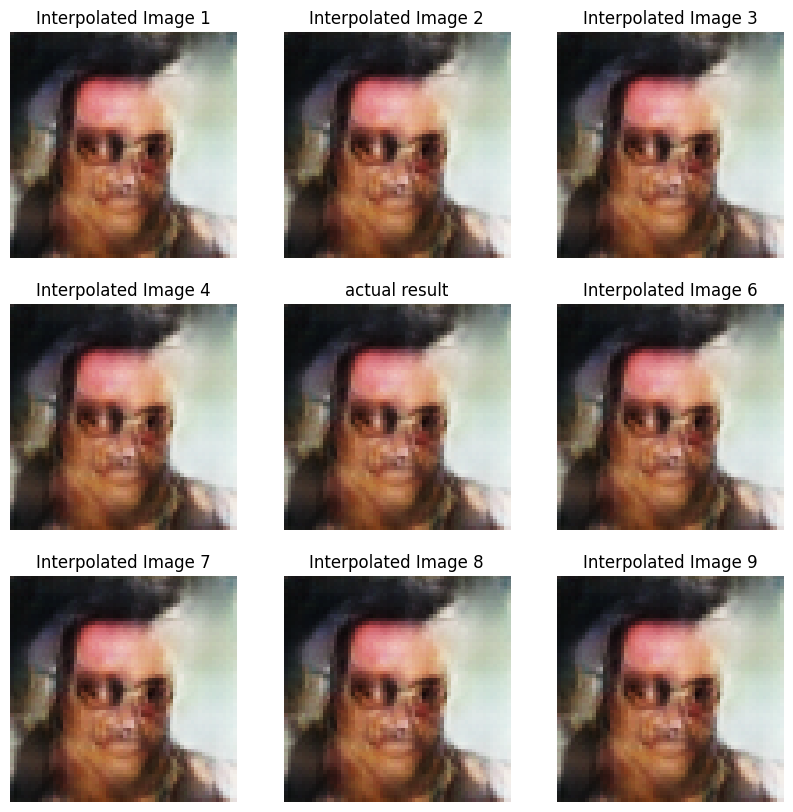

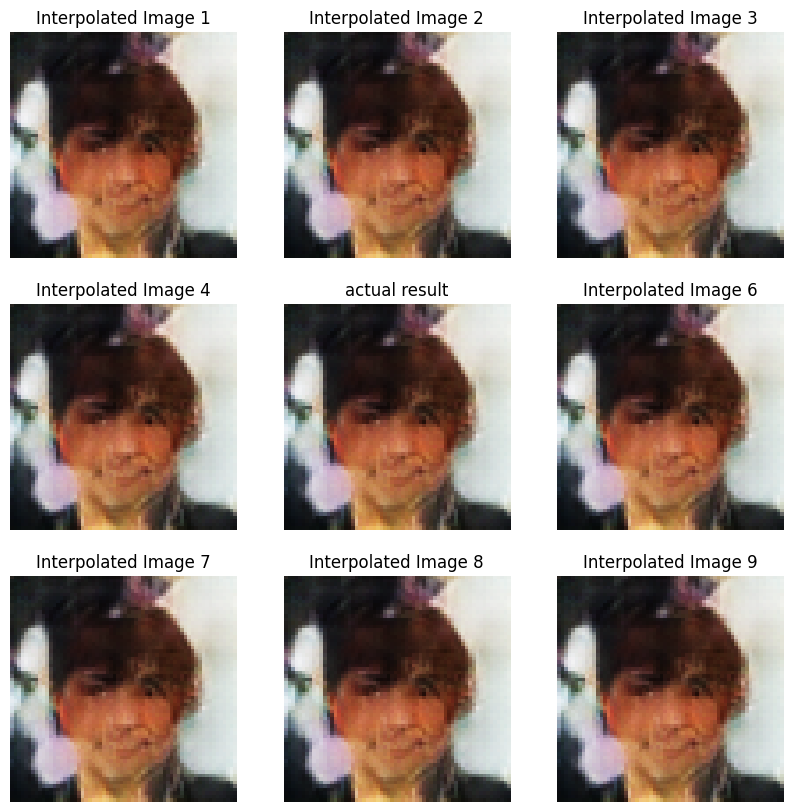

torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])


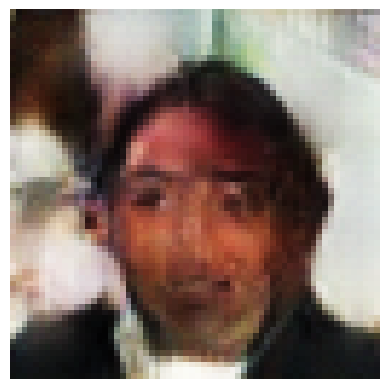

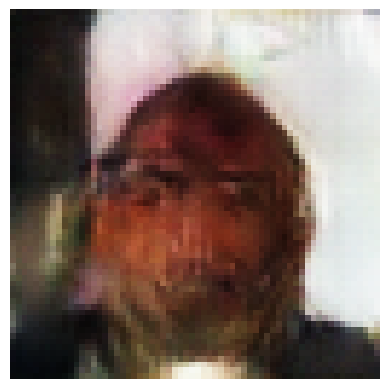

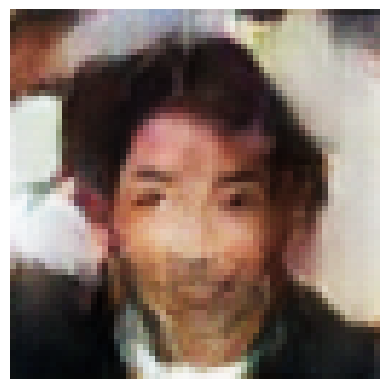

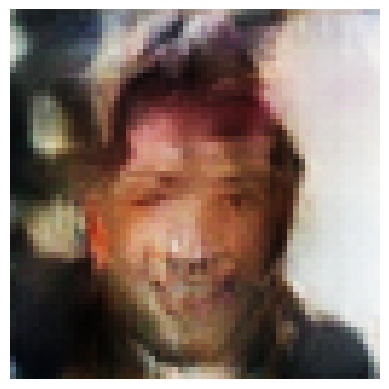

result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])


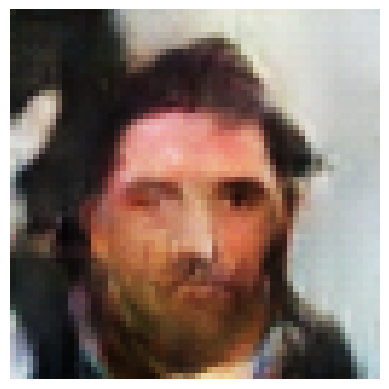

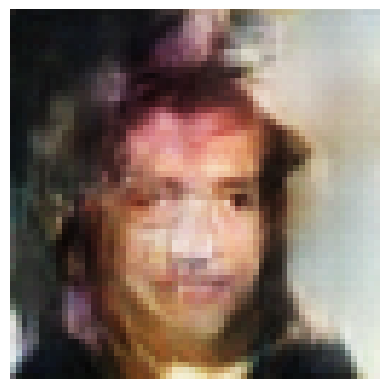

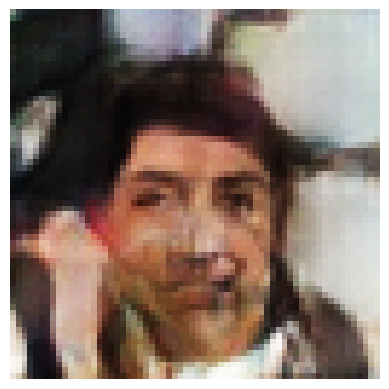

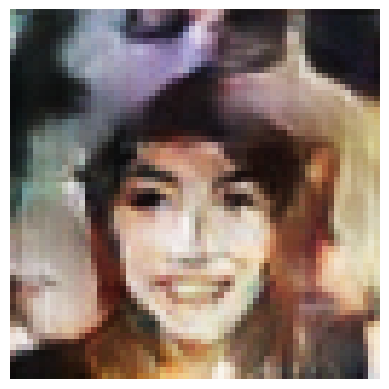

result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])


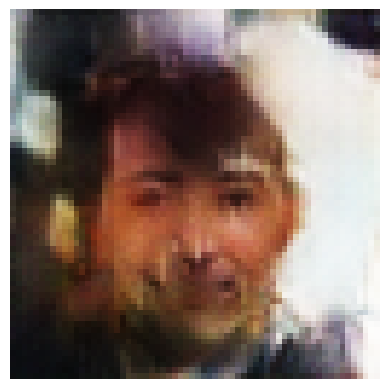

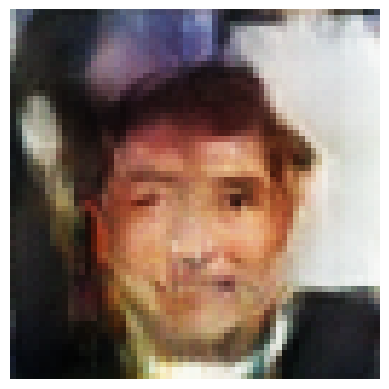

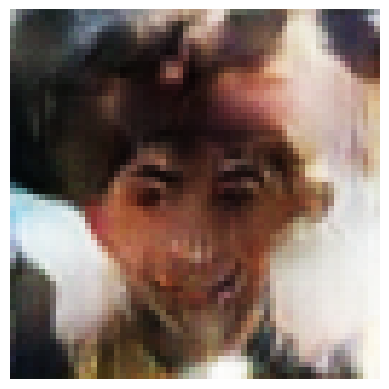

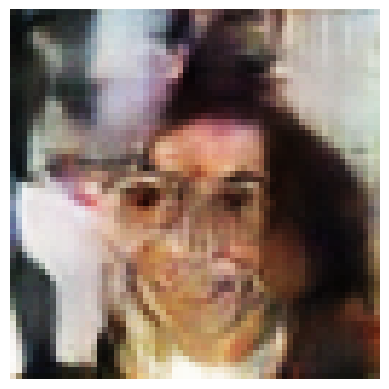

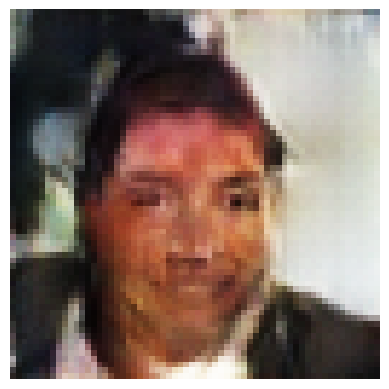

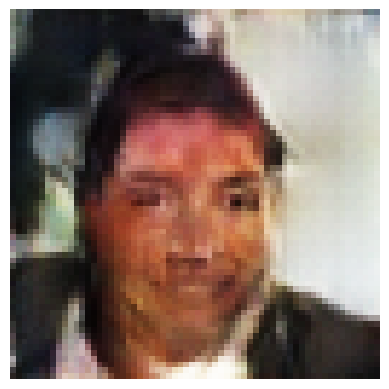

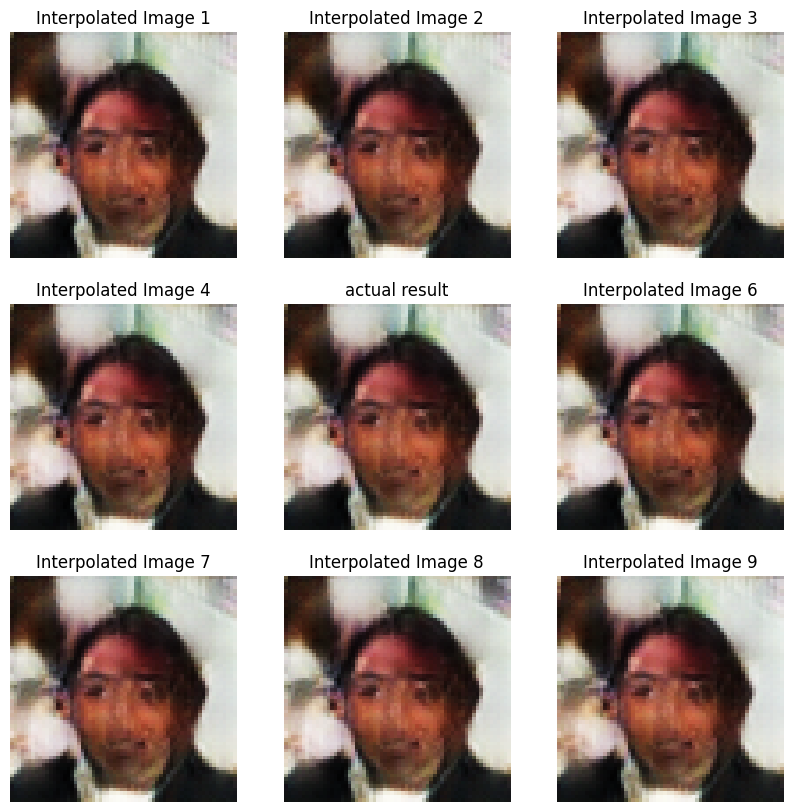

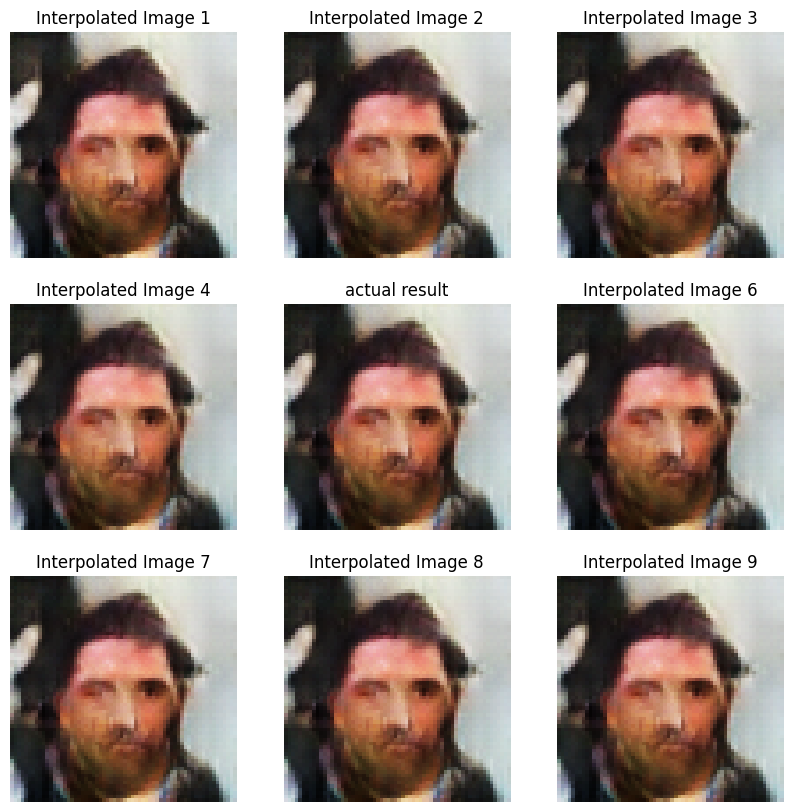

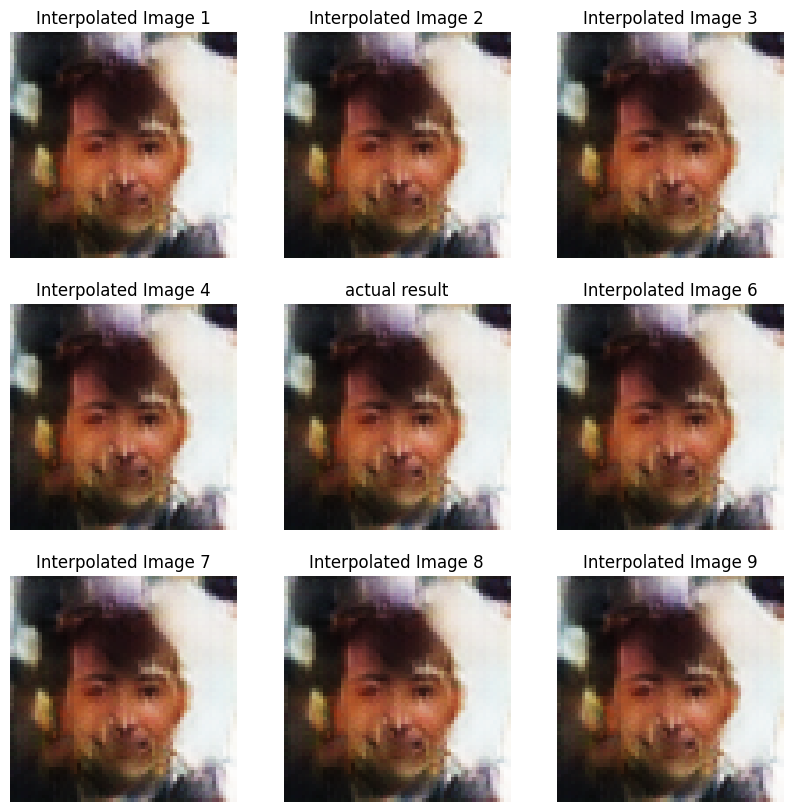

torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])


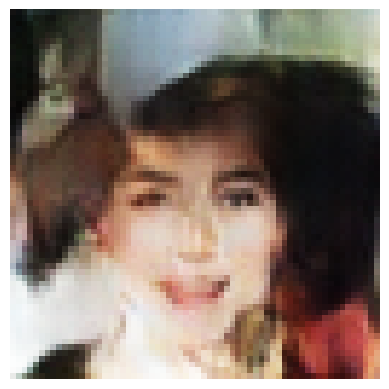

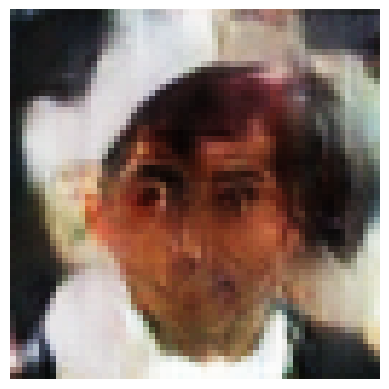

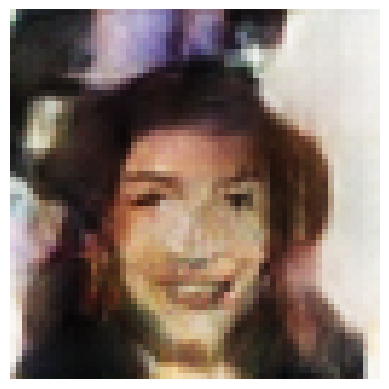

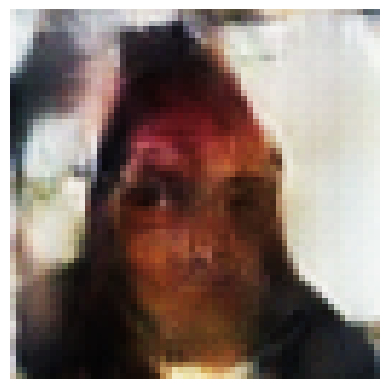

result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])


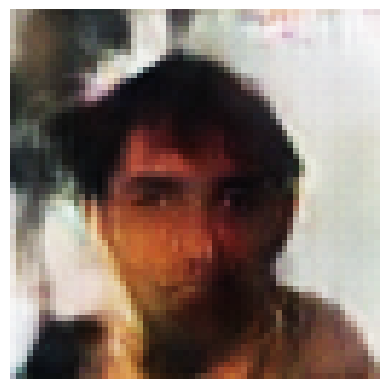

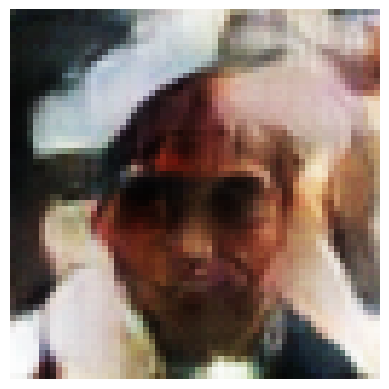

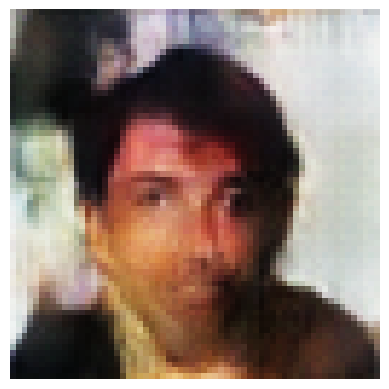

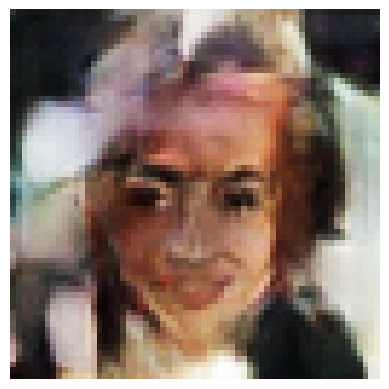

result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])


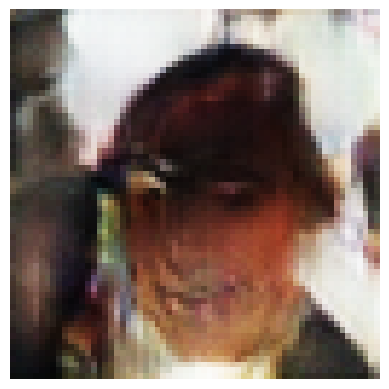

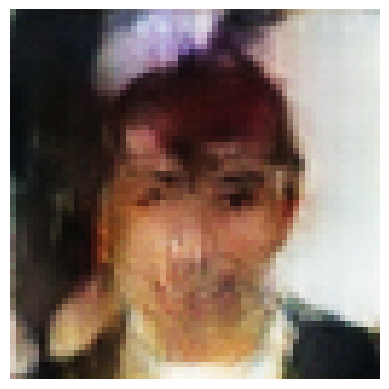

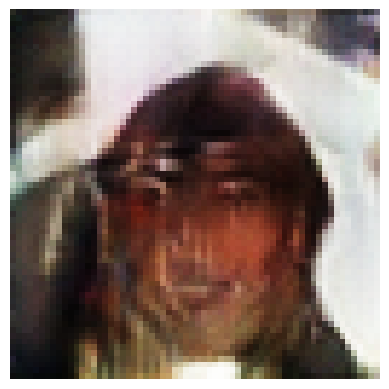

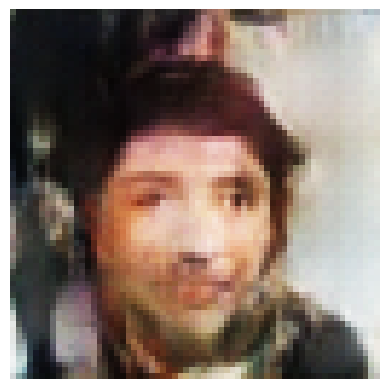

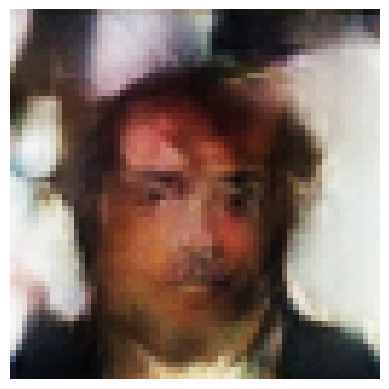

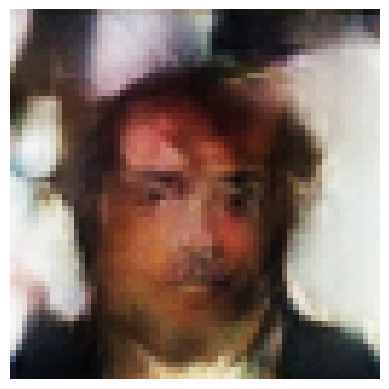

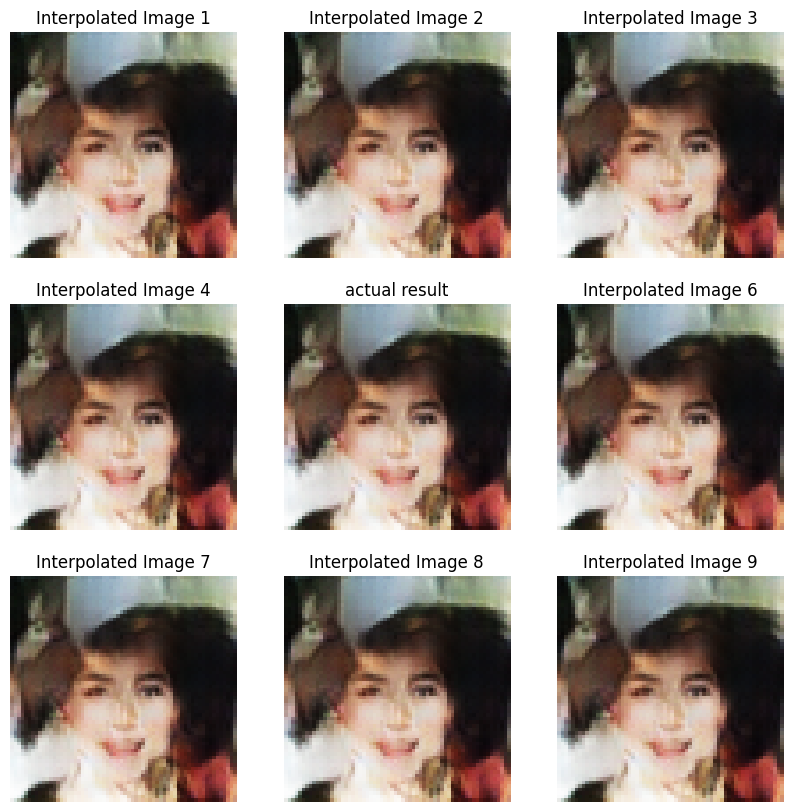

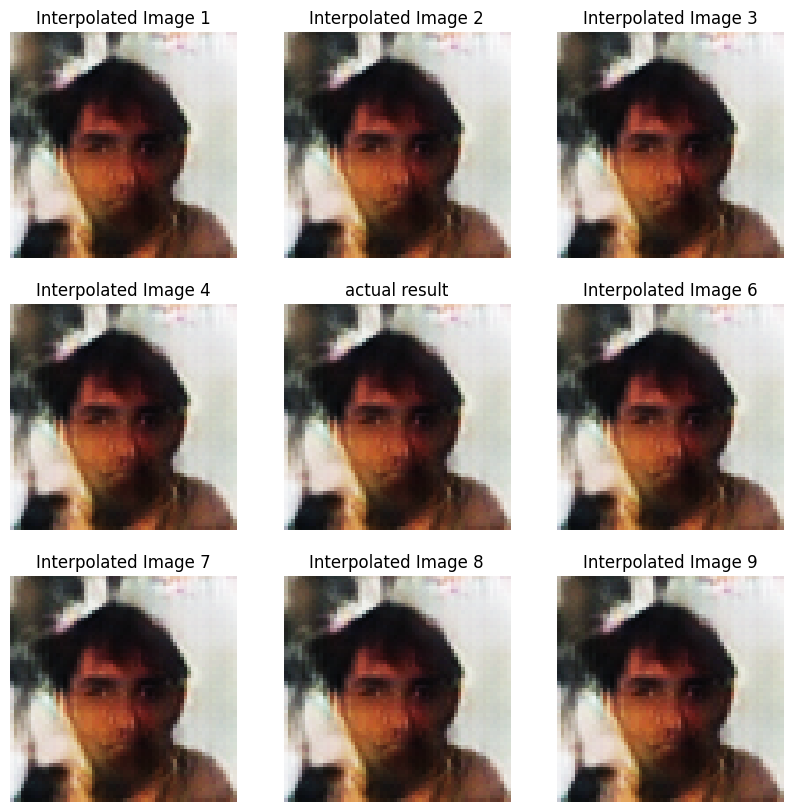

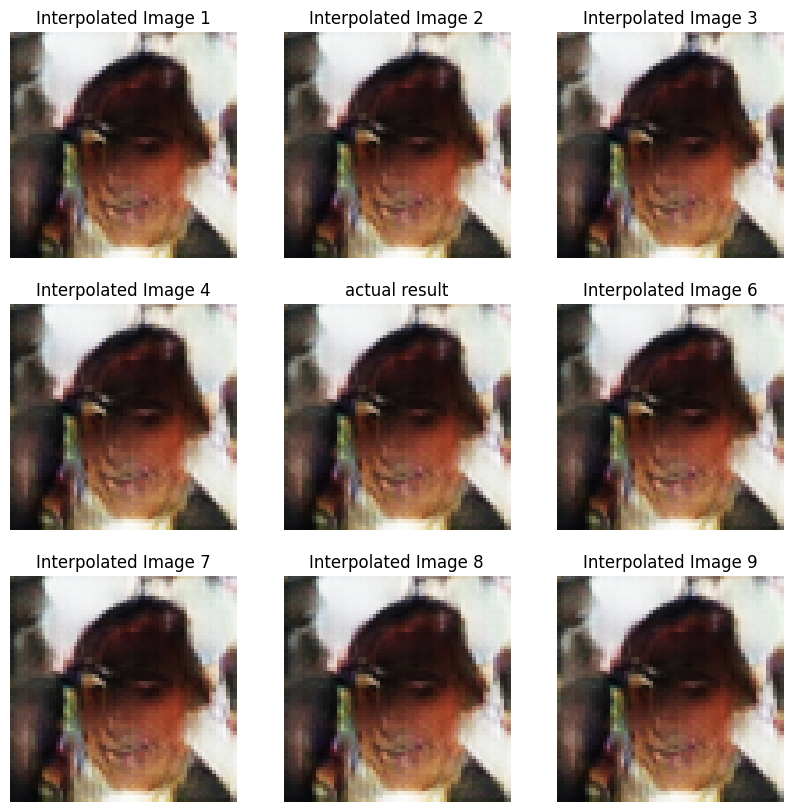

torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
torch.Size([3, 64, 64])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])


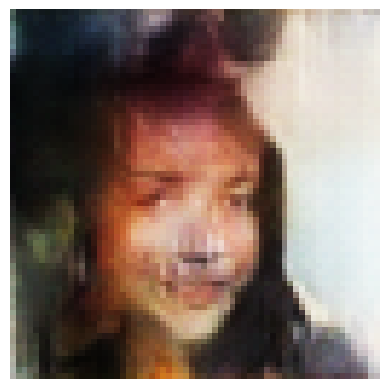

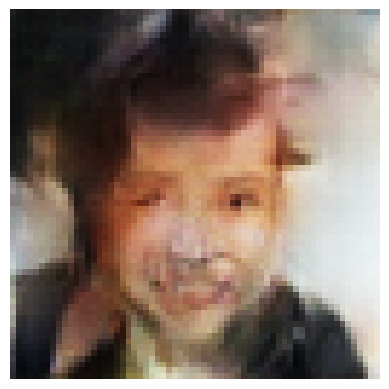

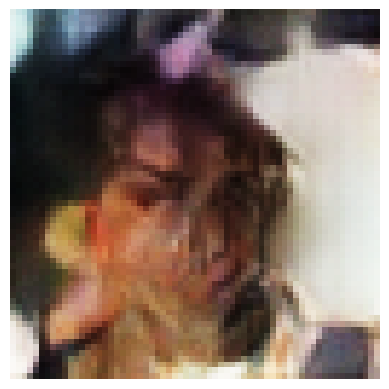

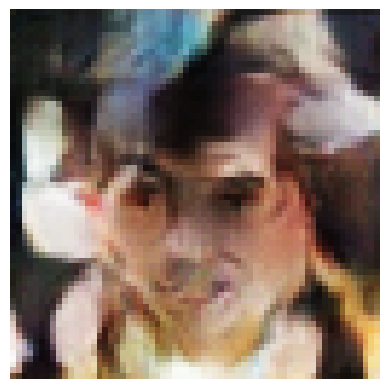

result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])


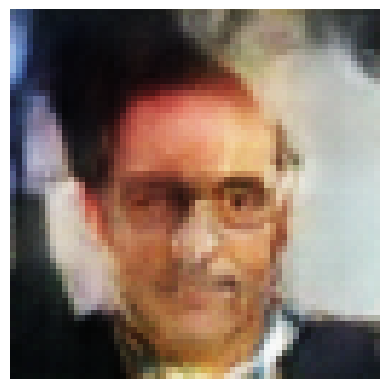

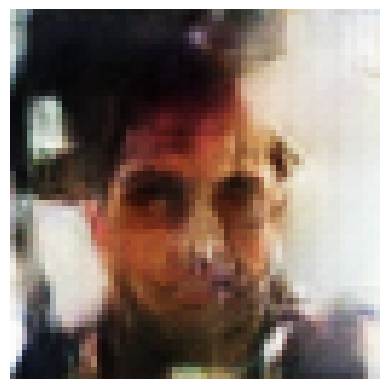

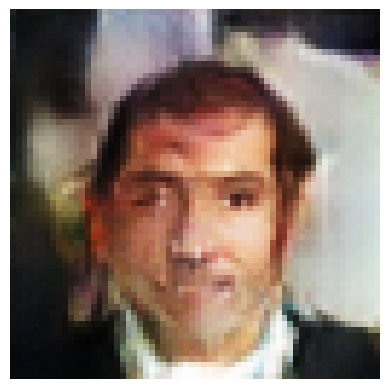

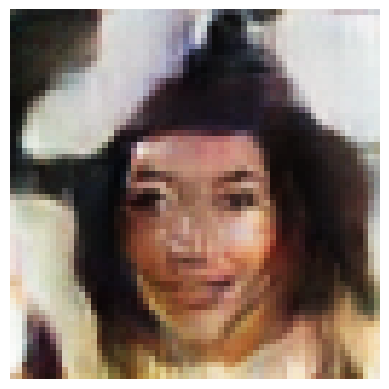

result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])


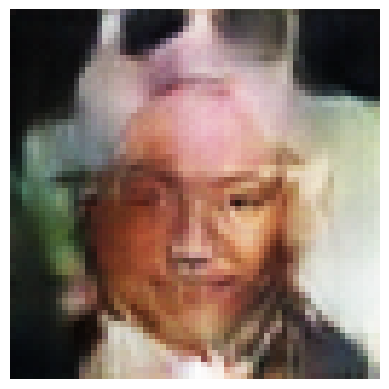

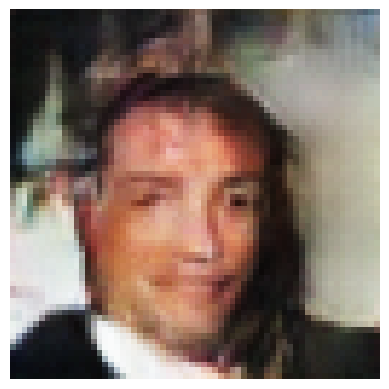

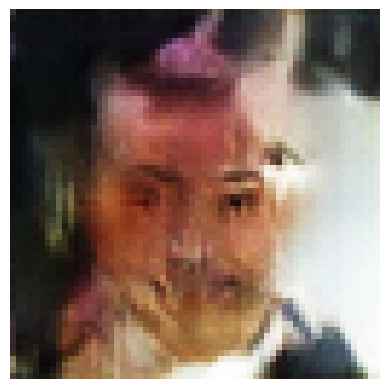

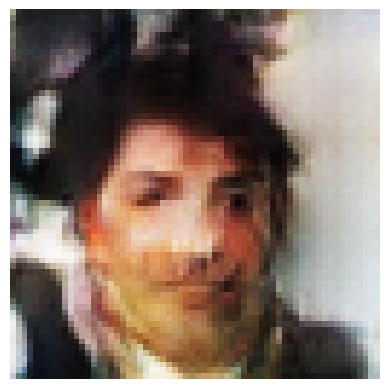

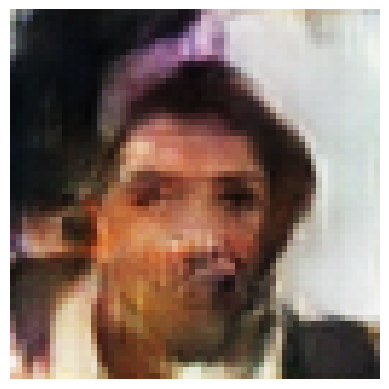

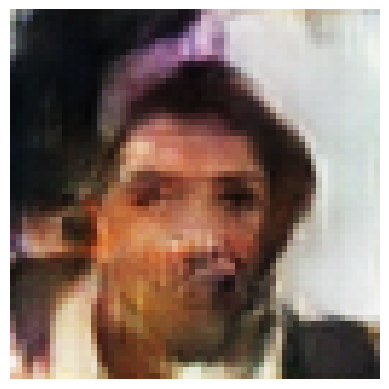

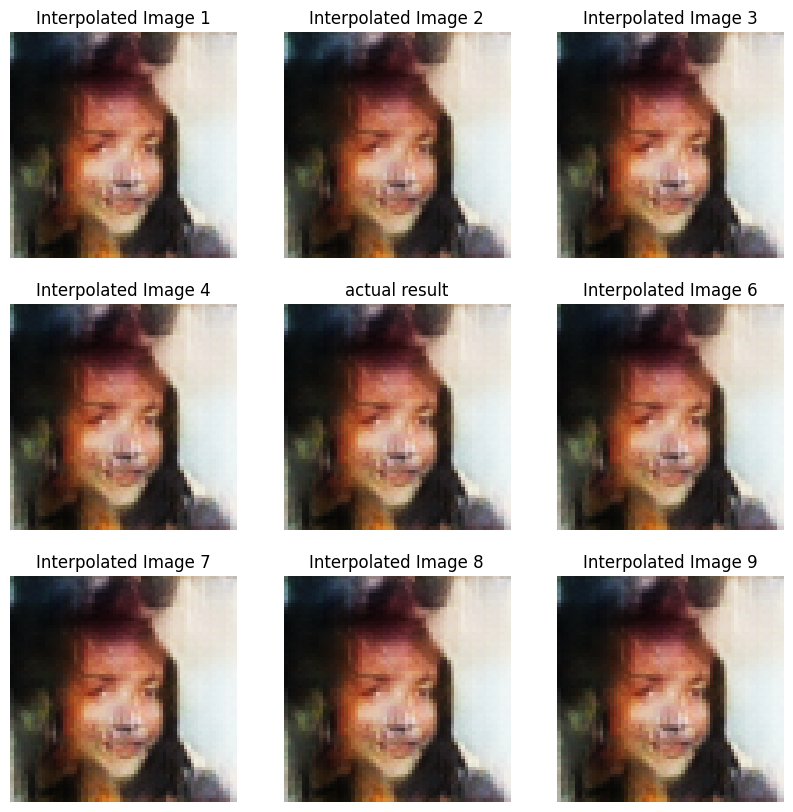

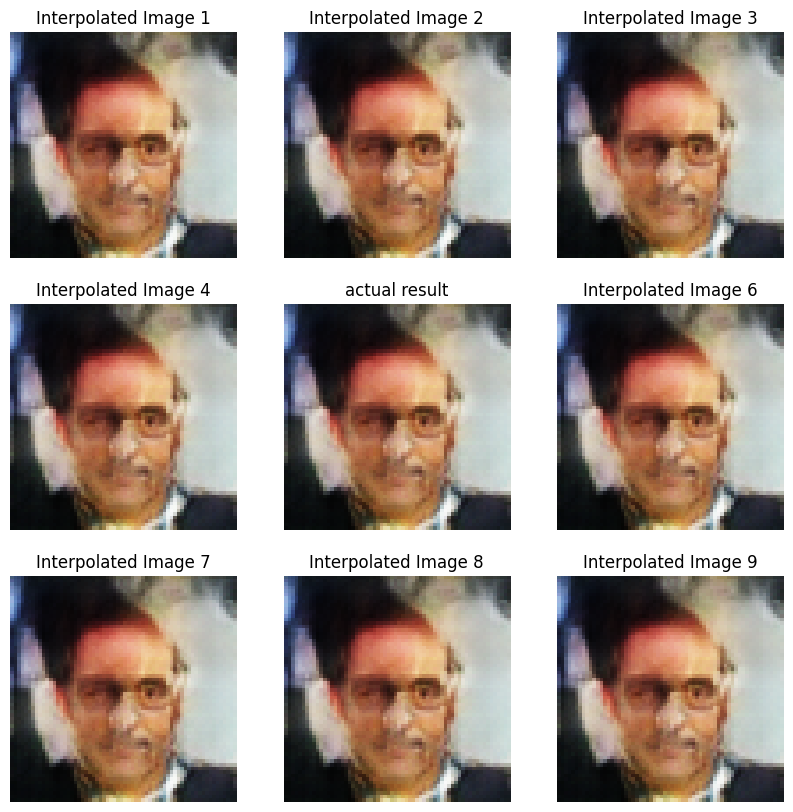

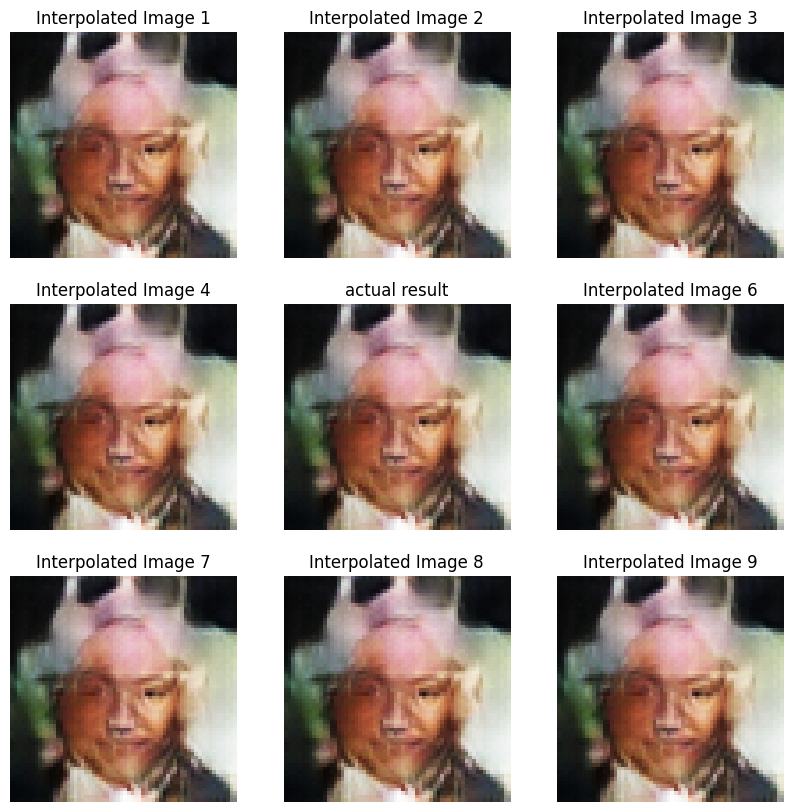

In [125]:
for i in range(3,30,3):
    j=i+3
    sampled_images1=[sampled_images11[0][i:j]]+[sampled_images11[1][i:j]]+[sampled_images11[2][i:j]]
    sampled_images2=[sampled_images21[0][i:j]]+[sampled_images21[1][i:j]]+[sampled_images21[2][i:j]]
    sampled_images3=[sampled_images31[0][i:j]]+[sampled_images31[1][i:j]]+[sampled_images31[2][i:j]]+[sampled_images31[3][i:j]]+[sampled_images31[3][i:j]]
    sampled_tensors1=get_sampled_tensor(sampled_images1)
    sampled_tensors2=get_sampled_tensor(sampled_images2)
    sampled_tensors3=get_sampled_tensor(sampled_images3)  
    translated1,res1=vector_arithmetics_image_space2(sampled_tensors1, encoder)
    translated_to_image_all(translated1)
    translated2,res2=vector_arithmetics_image_space2(sampled_tensors2, encoder)
    translated_to_image_all(translated2)
    translated3,res=vector_arithmetics_image_space1(sampled_tensors3, encoder)
    translated_to_image_all(translated3)
    display_interpolated_images( res1, encoder, netG)
    display_interpolated_images( res2, encoder, netG)
    display_interpolated_images( res, encoder, netG)
                                                                                                                             
                                                                                                                             

In [118]:
sampled_images1

[['/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/000153.jpg',
  '/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/000032.jpg',
  '/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/000012.jpg'],
 ['/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/000056.jpg',
  '/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/000002.jpg',
  '/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/000085.jpg'],
 ['/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/001166.jpg',
  '/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/000237.jpg',
  '/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/001506.jpg']]

In [19]:
def get_sampled_tensor(sampled_images):
    sampled_tensors=[]
    for i in sampled_images:
        for j in i:
            sampled_tensors.append(path_to_tensor(j))
            
    sampled_tensors=torch.stack(sampled_tensors,dim=0)
    return sampled_tensors

In [103]:
translated1,res1=vector_arithmetics_image_space2(sampled_tensors1, encoder)

result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])


In [26]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'output' is the tensor from the generator
# Normalize from [-1, 1] to [0, 1]
def translated_to_image(translated_images):
    output = translated_images[0]
    output = (output + 1) / 2.0

    # Assuming the output tensor shape is [1, 3, 64, 64] and you want to display the first image in the batch
    image_to_display = output[0]  # Get the first image in the batch

    # Convert to NumPy array and transpose the axes from (C, H, W) to (H, W, C) for image display
    image_to_display = image_to_display.detach().cpu().numpy()  # Detach and move to cpu
    image_to_display = np.transpose(image_to_display, (1, 2, 0))  # Transpose the dimensions

    # Display the image
    plt.imshow(image_to_display)
    plt.axis('off')  # Turn off axis numbers and ticks
    plt.show()

In [101]:
def translated_to_image_all(translated_images):
    for i in range(len(translated_images)):
        output = translated_images[i]
        output = (output + 1) / 2.0

        # Assuming the output tensor shape is [1, 3, 64, 64] and you want to display the first image in the batch
        image_to_display = output[0]  # Get the first image in the batch

        # Convert to NumPy array and transpose the axes from (C, H, W) to (H, W, C) for image display
        image_to_display = image_to_display.detach().cpu().numpy()  # Detach and move to cpu
        image_to_display = np.transpose(image_to_display, (1, 2, 0))  # Transpose the dimensions

        # Display the image
        plt.imshow(image_to_display)
        plt.axis('off')  # Turn off axis numbers and ticks
        plt.show()

In [57]:
import matplotlib.pyplot as plt
import numpy as np

def display_image(image_tensor):
    # Assuming the tensor is of shape (3, 64, 64)
    image_array = np.transpose(image_tensor, (1, 2, 0))  # (64, 64, 3)
    plt.imshow(image_array)
    plt.axis('off')
    plt.show()



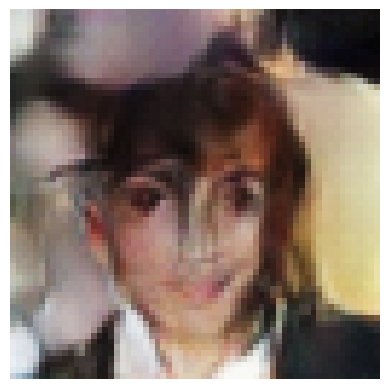

In [27]:
translated_to_image(translated1)

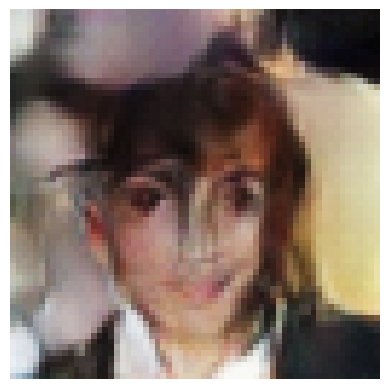

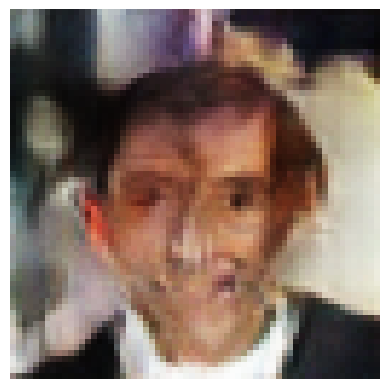

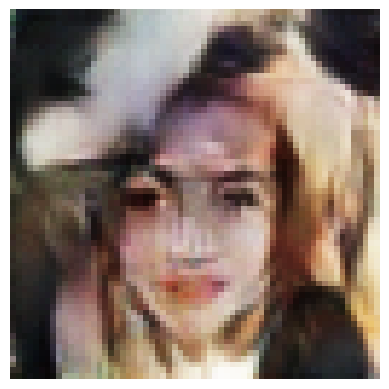

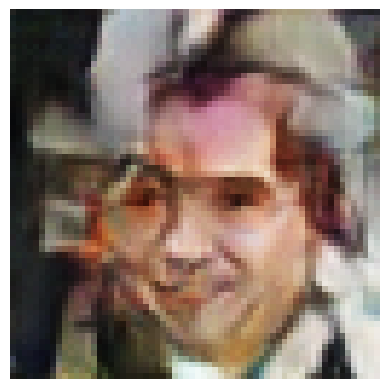

In [104]:
translated_to_image_all(translated1)

result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])


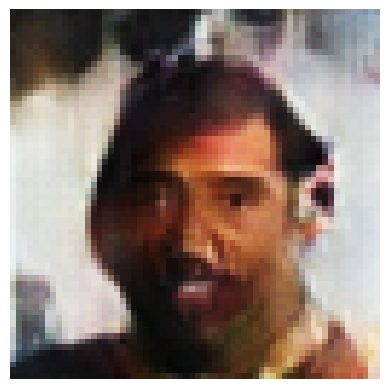

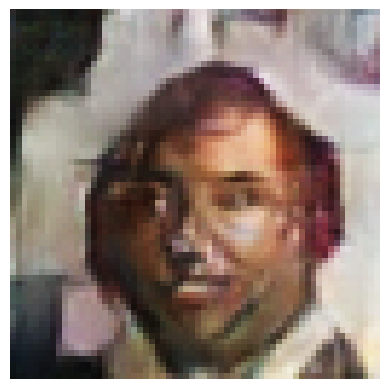

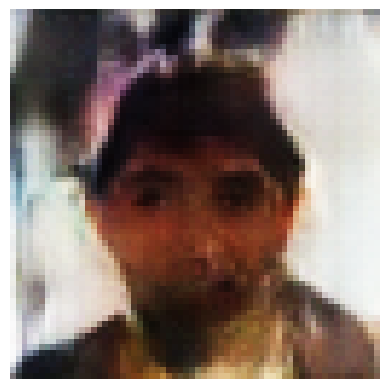

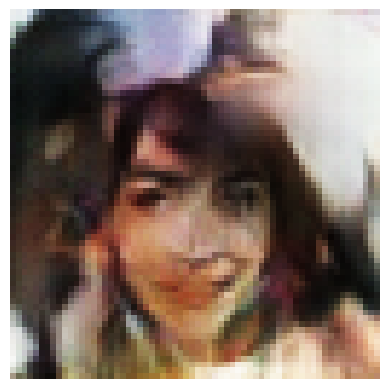

In [105]:
translated2,res2=vector_arithmetics_image_space2(sampled_tensors2, encoder)
translated_to_image_all(translated2)

result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])
result= torch.Size([100])


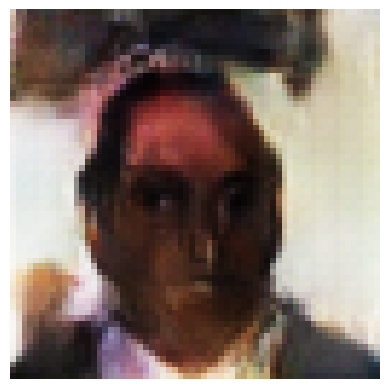

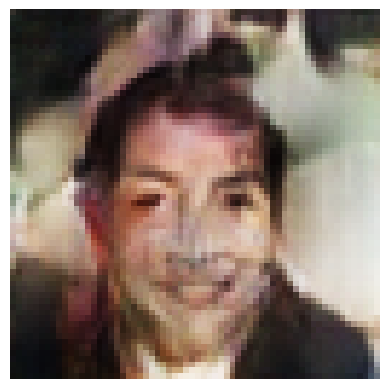

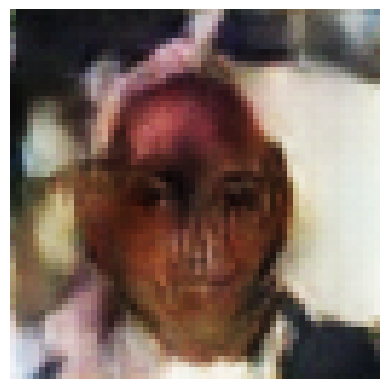

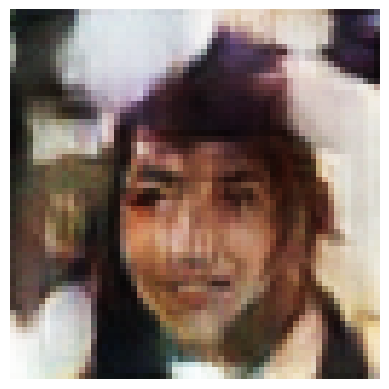

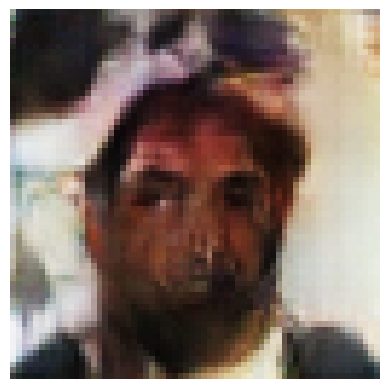

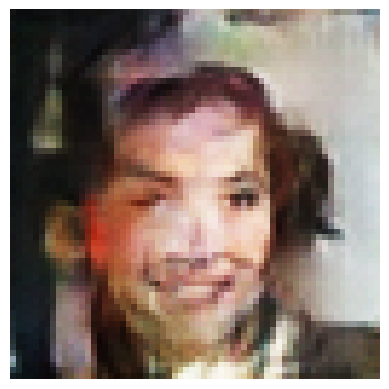

In [108]:
translated3,res=vector_arithmetics_image_space1(sampled_tensors3, encoder)
translated_to_image_all(translated3)

In [46]:
avg1=get_avg_images(sampled_tensors1)
avg2=get_avg_images(sampled_tensors2)
avg3=get_avg_images(sampled_tensors3)

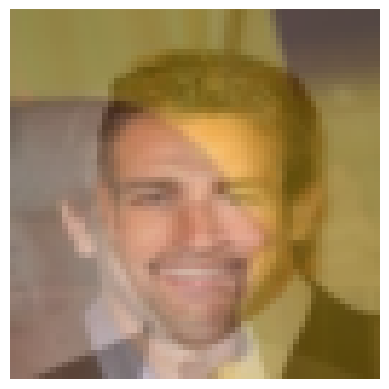

In [59]:
# Example usage
# Assuming you have your image tensor named 'image_tensor'
display_image(avg1[0])

In [60]:
avg1[0].unsqueeze(0)

tensor([[[[0.5791, 0.5699, 0.5660,  ..., 0.3307, 0.3307, 0.3281],
          [0.5791, 0.5699, 0.5660,  ..., 0.3307, 0.3307, 0.3281],
          [0.5791, 0.5725, 0.5686,  ..., 0.3307, 0.3320, 0.3320],
          ...,
          [0.5490, 0.5542, 0.5595,  ..., 0.3569, 0.3725, 0.4013],
          [0.5477, 0.5542, 0.5621,  ..., 0.3556, 0.3712, 0.4000],
          [0.5529, 0.5582, 0.5647,  ..., 0.3582, 0.3673, 0.3935]],

         [[0.5320, 0.5359, 0.5386,  ..., 0.2797, 0.2797, 0.2797],
          [0.5320, 0.5359, 0.5386,  ..., 0.2784, 0.2784, 0.2784],
          [0.5320, 0.5359, 0.5412,  ..., 0.2797, 0.2797, 0.2784],
          ...,
          [0.4301, 0.4353, 0.4392,  ..., 0.2758, 0.2889, 0.3163],
          [0.4314, 0.4353, 0.4405,  ..., 0.2745, 0.2876, 0.3150],
          [0.4353, 0.4392, 0.4431,  ..., 0.2758, 0.2837, 0.3072]],

         [[0.3059, 0.2980, 0.2928,  ..., 0.2627, 0.2627, 0.2614],
          [0.3059, 0.2980, 0.2928,  ..., 0.2654, 0.2654, 0.2641],
          [0.3059, 0.2993, 0.2941,  ..., 0

In [50]:
translated3

[tensor([[[[ 0.6632, -0.1252, -0.1101,  ...,  0.6686,  0.6724,  0.6111],
           [ 0.5971, -0.0305, -0.1401,  ...,  0.7126,  0.6887,  0.6823],
           [ 0.4701,  0.0678, -0.2108,  ...,  0.6919,  0.6505,  0.6718],
           ...,
           [-0.1467, -0.6926, -0.7483,  ..., -0.6096, -0.6473, -0.6504],
           [-0.6349, -0.8012, -0.7952,  ..., -0.6325, -0.7266, -0.7637],
           [-0.8062, -0.8750, -0.8540,  ..., -0.6552, -0.7578, -0.7847]],
 
          [[ 0.5266, -0.3122, -0.2639,  ...,  0.6443,  0.6690,  0.6161],
           [ 0.3877, -0.2441, -0.3805,  ...,  0.6785,  0.6719,  0.6773],
           [ 0.2895, -0.1814, -0.3917,  ...,  0.6405,  0.6513,  0.6392],
           ...,
           [-0.1685, -0.6964, -0.7715,  ..., -0.5622, -0.5994, -0.5474],
           [-0.6709, -0.7916, -0.7897,  ..., -0.5759, -0.6649, -0.6772],
           [-0.8484, -0.8812, -0.8575,  ..., -0.6110, -0.6953, -0.7276]],
 
          [[ 0.4090, -0.2988, -0.3467,  ...,  0.5930,  0.5966,  0.5749],
           [ 

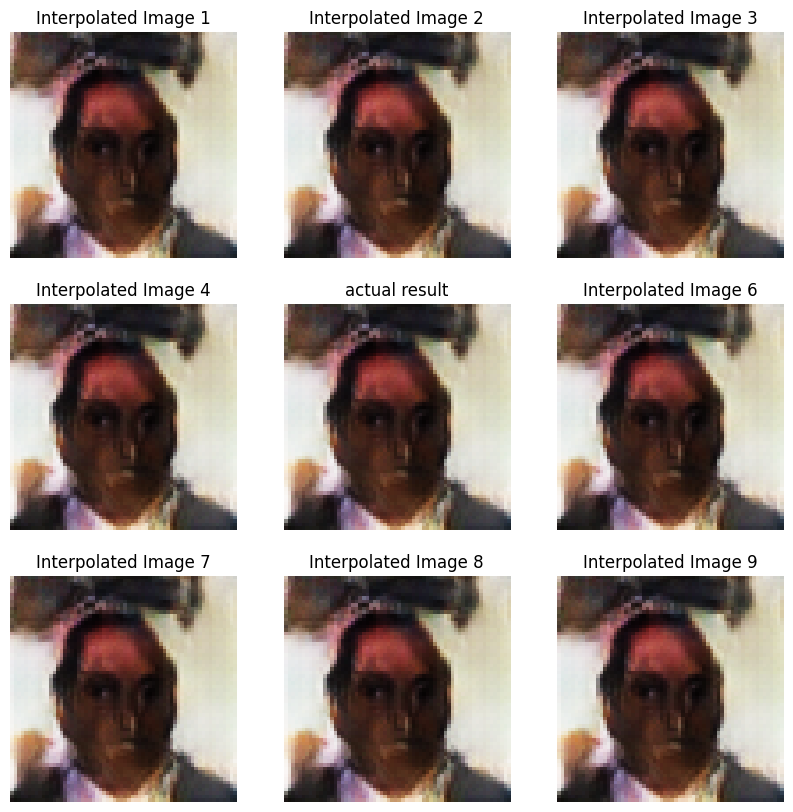

In [92]:
import torch

# Generate and display images with interpolated vectors
def generate_interpolated_images(central_vector, encoder, netG):
    device = central_vector.device  # Get the device of the central vector
    
    # Generate noise with scale ±0.25 on the same device as the central vector
#     noise = torch.FloatTensor(central_vector.size()).uniform_(-0.25, 0.25).to(device)
    
    # Generate random noise on the same device as the central vector
    noise = torch.randn(central_vector.size(), device=device)
    
    # Scale the noise with a factor in the interval [-0.25, 0.25]
    scale_factor = random.uniform(-0.25, 0.25)
    noise *= scale_factor
    
    # Add noise to the central vector
    interpolated_vector = central_vector + noise
    
    
    # Generate image from the interpolated vector
    interpolated_image = netG(interpolated_vector.unsqueeze(0).unsqueeze(2).unsqueeze(3))

    # Convert the image tensor to NumPy array and normalize
    interpolated_image = interpolated_image.detach().cpu().numpy().squeeze()
    interpolated_image = (interpolated_image + 1) / 2.0
    
    return interpolated_image

# Generate and display interpolated images
def display_interpolated_images( z_results, encoder, netG):
    # Central vector used to generate the central image
    central_vector = z_results[0]

    # Generate and display interpolated images
    plt.figure(figsize=(10, 10))
    for i in range(9):
        # Generate interpolated image
        interpolated_image = generate_interpolated_images(central_vector, encoder, netG)
        
        # Plot the interpolated image
        plt.subplot(3, 3, i + 1)
        plt.imshow(interpolated_image.transpose(1, 2, 0))
        if(i==4):
           plt.title(f"actual result")
        else:
            plt.title(f"Interpolated Image {i + 1}")
        plt.axis('off')

    plt.show()

# Display interpolated images
display_interpolated_images( res, encoder, netG)


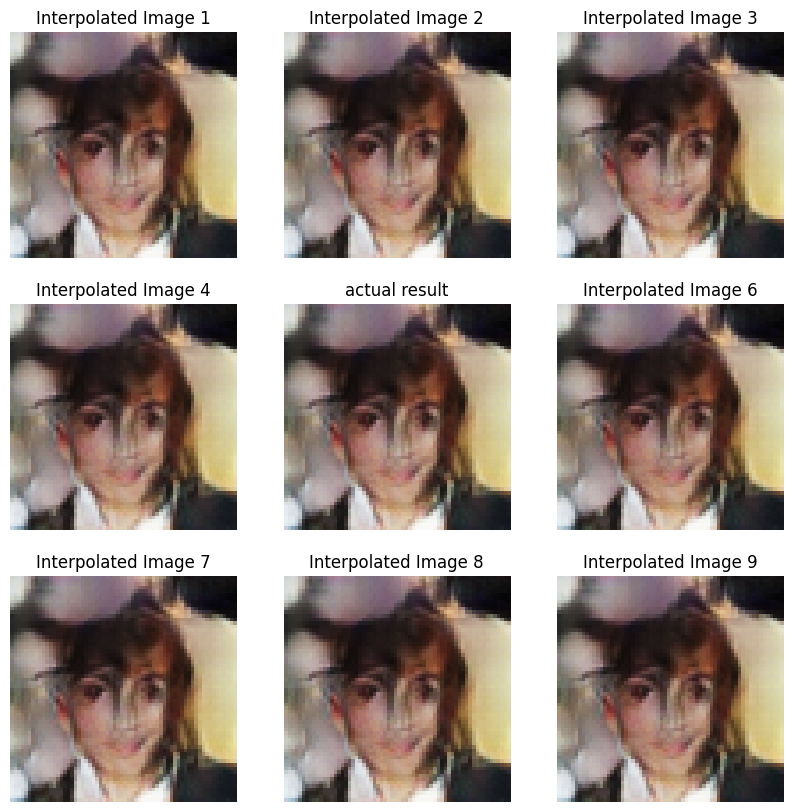

In [97]:
display_interpolated_images( res1, encoder, netG)

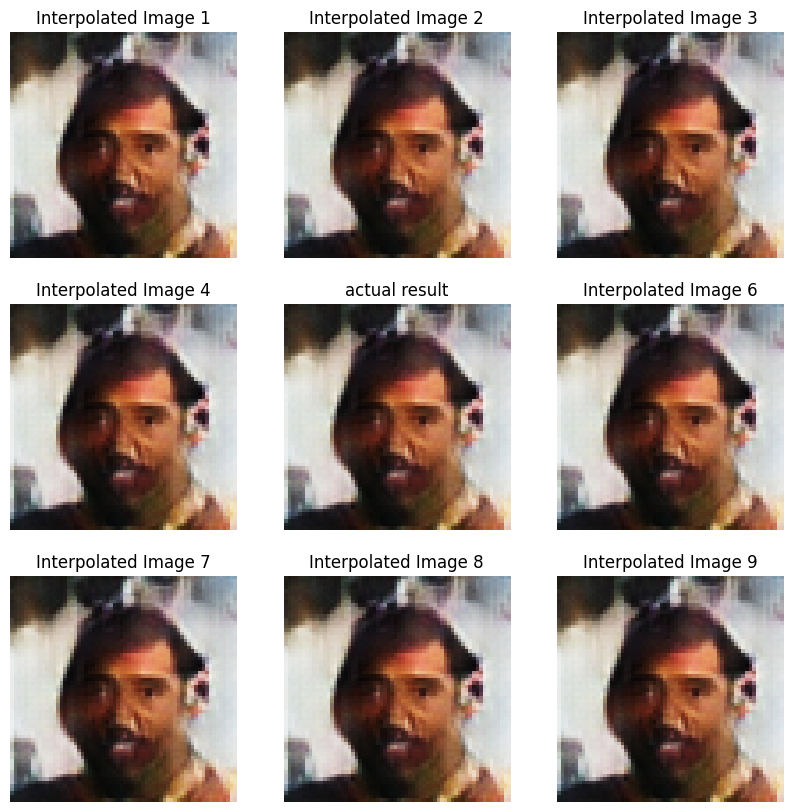

In [98]:
display_interpolated_images( res2, encoder, netG)